In [22]:
# Imports

import math, pickle, os, copy, sys, scipy.io, json, datetime

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import warnings
warnings.filterwarnings("ignore")

from numpy import random
from tqdm import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

from utils_pv import *
from samples.data_sim import PVDataset

#### FL
import torch
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, TensorDataset
from trainer import Trainer
from models import *
from metrics import mse

# Add the project directory to the path
PROJECT_DIR = os.path.dirname(os.path.dirname(os.getcwd()))
sys.path.insert(1, PROJECT_DIR)

# Set the random seed
random_seed = 46
random.seed(random_seed)
np.random.seed(random_seed)
random_state = np.random.RandomState(random_seed)

# Set the device
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

months_name = {1:'January', 2:'February', 3:'March', 4:'April', 5:'May', 6:'June', 7:'July', 8:'August', 9:'September', 10:'October', 11:'November', 12:'December'}

### 0. Generate data for multiple households

In [23]:
# Generate data

NUM_CLIENTS=40

train_columns = ['H_sun', 'T2m', 'WS10m', 'hourofd_x', 'hourofd_y', 'dayofy_x', 'dayofy_y', 'station_irrad_direct_prev', 'station_irrad_diffuse_prev', 'lag 1']

hour_begin, hour_end = 8, 18

city_names = ['Lausanne']
# env_dict = {'city_names':city_names,
#             'num_clients': NUM_CLIENTS, 'num_modes': len(city_names),
#             'tilt_std': 5, 'az_std': 5, 'weather_dev':0.1,
#             'irrad_std':0.2, 'altitude_dev':0.1, 'shadow_peak_red':1,
#             'module_name': get_available_modules('sandia')[0:NUM_CLIENTS], #['Canadian_Solar_CS5P_220M___2009_'],
#             'inverter_name': get_available_inverters('cec')[0:NUM_CLIENTS], # ['ABB__MICRO_0_25_I_OUTD_US_208__208V_'],
#             'lags':[1], 'months':[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], 'hours':np.arange(hour_begin, hour_end), 
#             'train_scenarios':{'1y':{'m_train':None, 'train_years':[2018], 'valid_years':2019}}}
# env_dict = PVDataset(env_dict).generate_clients_data()

# Load pickle
env_dict = pickle.load(open('env_dict.pkl', 'rb'))

time_series = []

for client_ in range(NUM_CLIENTS):
    time_series_ = env_dict['train_scenarios']['1y']['time_series'][client_]

    # Remove nights
    time_series_ = time_series_[time_series_['hour_day'].isin(np.arange(hour_begin, hour_end))]

    # Add column day_of_month using column time
    time_series_['day'] = time_series_['time'].dt.day

    # Reorder columns
    time_series_ = time_series_[['time', 'year', 'month', 'day', 'hour_day', 'H_sun', 'T2m', 'WS10m', 'hourofd_x', 'hourofd_y', 'dayofy_x', 'dayofy_y', 'station_irrad_direct_prev', 'station_irrad_diffuse_prev', 'lag 1', 'target']]

    time_series.append(time_series_)

### 1. Scenario 1
> train with january and predict all year

In [30]:
def FL_scenario1(lr_, weight_decay_, test_year, verbose=False):
    
    if verbose:
        print(f'lr: {lr_} - weight_decay: {weight_decay_} - test_year: {test_year}')
    
    results_list = []
    
    # Set the random seed
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    torch.manual_seed(random_seed)

    # Define scenario's parameters
    train_years = [test_year]
    num_epochs = 300
    train_months = [1]
    test_months = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

    # Define the model
    global_model = TwoLayerNN(input_dim=len(train_columns), output_dim=1, hidden_dim1=64, hidden_dim2=32).to(DEVICE)
    for name, param in global_model.named_parameters():
        if 'weight' in name:
            nn.init.xavier_normal_(param)
        if 'bias' in name:
            nn.init.zeros_(param)

    # Ensure client models are independent copies of the global model
    client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

    # Store training values
    train_losses = {'client_{}'.format(i):[] for i in range(NUM_CLIENTS)}
    x_means, x_stds, y_means, y_stds = [], [], [], []

    # Training loop
    for epoch in tqdm(range(num_epochs), desc="Epochs", disable=not verbose):
        # Ensure each client starts with the latest global model
        client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]
        
        for client_num in range(NUM_CLIENTS):
            client_model = client_models[client_num]
            client_model.train()
            
            optimizer = optim.SGD(
                [param for param in client_model.parameters() if param.requires_grad],
                lr=lr_,
                momentum=0.9,
                weight_decay=weight_decay_,
            )
            
            trainer = Trainer(
                model=client_model,
                criterion=nn.MSELoss(reduction='none').to(DEVICE),
                metric=mse,
                device=DEVICE,
                optimizer=optimizer,
                cast_label=False,
            )

            time_series_client = time_series[client_num]
            
            x_train = time_series_client[time_series_client.year.isin(train_years) & time_series_client.month.isin(train_months)][train_columns].values
            y_train = time_series_client[time_series_client.year.isin(train_years) & time_series_client.month.isin(train_months)]['target'].values
            
            x_mean, x_std = x_train.mean(axis=0), x_train.std(axis=0)
            y_mean, y_std = y_train.mean(), y_train.std()
            
            if len(x_means) < NUM_CLIENTS:
                x_means.append(x_mean)
                x_stds.append(x_std)
                y_means.append(y_mean)
                y_stds.append(y_std)
            
            x_train = (x_train - x_mean) / x_std
            y_train = (y_train - y_mean) / y_std
            y_train = np.array(y_train).reshape(-1, 1)

            train_dataset = TensorDataset(torch.tensor(x_train), torch.tensor(y_train))
            train_dataloader = DataLoader(train_dataset, batch_size=512, shuffle=True)

            for x_batch, y_batch in train_dataloader:
                x_batch = x_batch.to(DEVICE).type(torch.float32)
                y_batch = y_batch.to(DEVICE).type(torch.float32)

                optimizer.zero_grad()

                outputs = client_model(x_batch)
                loss = trainer.criterion(outputs, y_batch).mean()

                loss.backward()

                optimizer.step()
            
            train_losses['client_{}'.format(client_num)].append(loss.item())
        
        # Update the global model
        with torch.no_grad():
            global_model_dict = global_model.state_dict()
            for param in global_model_dict.keys():
                param_sum = sum(client_models[i].state_dict()[param] for i in range(NUM_CLIENTS))
                global_model_dict[param] = param_sum / NUM_CLIENTS
            global_model.load_state_dict(global_model_dict)
        
        client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]
        
        
    # Set the model to evaluation mode
    global_model.eval()

    # Test for each client
    for client_num in range(NUM_CLIENTS):
        time_series_client = time_series[client_num]
        x_test = time_series_client[(time_series_client.year == test_year) & (time_series_client.month.isin(test_months))][train_columns].values
        y_test = time_series_client[(time_series_client.year == test_year) & (time_series_client.month.isin(test_months))]['target'].values
        x_test = (x_test - x_means[client_num]) / x_stds[client_num]
        y_test = (y_test - y_means[client_num]) / y_stds[client_num]
        y_test = np.array(y_test).reshape(-1, 1)
        
        with torch.no_grad():
            y_pred = global_model(torch.tensor(x_test).to(DEVICE).type(torch.float32))
            
        test_loss = trainer.criterion(y_pred, torch.tensor(y_test).to(DEVICE).type(torch.float32)).mean()
        
        # Store the results
        result = {
            'lr': lr_,
            'weight_decay': weight_decay_,
            'test_year': test_year,
            'client_num': client_num,
            'y_true': y_test * y_stds[client_num] + y_means[client_num],
            'y_pred': y_pred.cpu().numpy() * y_stds[client_num] + y_means[client_num],
            'test_loss': test_loss.item(),
            'training_loss_history': train_losses['client_{}'.format(client_num)]
        }
        
        results_list.append(result)
                
    return results_list

In [31]:
# Define the values for lr, weight_decay, and test_year
lr_values = [0.001, 0.01, 0.1] 
weight_decay_values = [5e-4, 5e-3, 5e-2]
test_year_values = [2014, 2015, 2016, 2017, 2018]

results_dict = {}

# Define the total number of iterations
total_iterations = len(lr_values) * len(weight_decay_values) * len(test_year_values)

with tqdm(total=total_iterations, desc="Progress") as pbar:
    for lr in lr_values:
        for weight_decay in weight_decay_values:
            for test_year in test_year_values:
                key = (lr, weight_decay, test_year)
                results_dict[key] = pd.DataFrame(FL_scenario1(lr, weight_decay, test_year))
                pbar.update(1) 
            
# Concatenate DataFrames for different configurations into a single DataFrame
final_df = pd.concat(results_dict.values(), ignore_index=True)

# Export to json
final_df.to_json('FL_results/FL_scenario1.json')

final_df.sample(3)

Progress: 100%|██████████| 36/36 [02:33<00:00,  4.27s/it]


,lr,weight_decay,test_year,client_num,y_true,y_pred,test_loss,training_loss_history
92,0.06,0.0005,2015,2,"[[8.263188405967714], [11.667276021974319], [1...","[[17.600113], [22.119009], [24.489367], [35.22...",1.247690,"[1.8524093627929688, 0.9159219264984131, 0.643..."
161,0.10,0.0050,2017,1,"[[18.880080482163038], [47.11957895054925], [6...","[[11.401093], [22.543224], [43.169907], [60.99...",5.027987,"[1.7301222085952759, 0.5764605402946472, 0.420..."
115,0.06,0.0050,2017,0,"[[21.730395678170556], [49.242168824235826], [...","[[14.315067], [25.883379], [49.953392], [71.16...",1.800183,"[1.7003620862960815, 0.8619552254676819, 0.600..."


In [56]:
# Compute best results from Scenario 1
df1 = pd.read_json('FL_results/FL_scenario1.json')

# compute nbr of gs values
nbr_gs_values = len(df1['lr'].unique()) * len(df1['weight_decay'].unique())
print(f'Scenario 1 tested with {nbr_gs_values} different hyperparameters combinations and {len(df1.client_num.unique())} clients')

best_params = df1.groupby(['lr', 'weight_decay'])['test_loss'].mean().idxmin()

print(f'Best parameters: lr={best_params[0]}, weight_decay={best_params[1]}')

display(df1[(df1['lr']==best_params[0]) & (df1['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean())

print('Overall loss over 5 years: %.3f ± %.3f' % (df1[(df1['lr']==best_params[0]) & (df1['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.mean(), df1[(df1['lr']==best_params[0]) & (df1['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.std()))

Scenario 1 tested with 12 different hyperparameters combinations and 5 clients
Best parameters: lr=0.1, weight_decay=0.05


test_year
2015    1.074298
2016    0.801739
2017    0.981258
Name: test_loss, dtype: float64

Overall loss over 5 years: 0.952 ± 0.113


In [57]:
df1.groupby(['lr', 'weight_decay'])['test_loss'].mean()

lr    weight_decay
0.01  0.0005          1.108455
      0.0050          1.104534
      0.0500          1.145353
0.03  0.0005          1.309174
      0.0050          1.277889
      0.0500          1.080563
0.06  0.0005          2.219342
      0.0050          2.065783
      0.0500          1.049151
0.10  0.0005          3.514951
      0.0050          3.476467
      0.0500          0.952432
Name: test_loss, dtype: float64

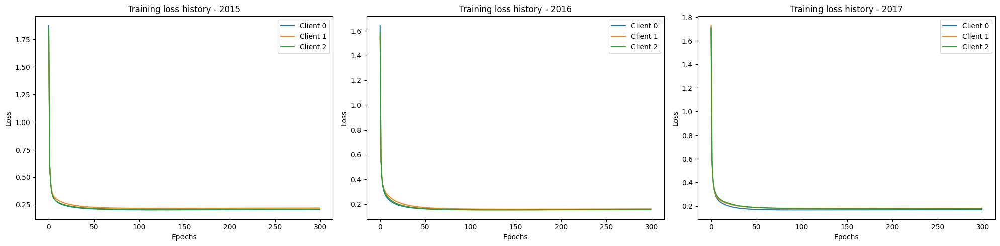

In [65]:
# create a 1x3 figure with the training loss history of each client for each year
fig, ax = plt.subplots(1, len(df1['test_year'].unique()), figsize=(20, 5))

for i, year in enumerate(df1['test_year'].unique()):
    for client_num in range(NUM_CLIENTS):
        ax[i].plot(df1[(df1['lr']==best_params[0]) & (df1['weight_decay']==best_params[1]) & (df1['test_year']==year) & (df1['client_num']==client_num)]['training_loss_history'].values[0], label=f'Client {client_num}')
    ax[i].set_title(f'Training loss history - {year}')
    ax[i].set_xlabel('Epochs')
    ax[i].set_ylabel('Loss')
    ax[i].legend()

plt.tight_layout()
plt.show()

### 2. Scenario 2
> train with all data until prediction month

In [70]:
def FL_scenario2(lr_, weight_decay_, test_year, selected_months=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], verbose=False):

    if verbose:
        print(f'lr: {lr_} - weight_decay: {weight_decay_} - test_year: {test_year}')

    results_list = []

    # Set the random seed
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    torch.manual_seed(random_seed)

    # Define scenario's parameters
    num_epochs = 150
    train_years = [test_year]

    # Define the model
    global_model = TwoLayerNN(input_dim=len(train_columns), output_dim=1, hidden_dim1=32, hidden_dim2=32).to(DEVICE)
    for name, param in global_model.named_parameters():
        if 'weight' in name:
            nn.init.xavier_normal_(param)
        if 'bias' in name:
            nn.init.zeros_(param)

    # Define the client models
    client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

    # Store training values
    train_losses = {'client_{}'.format(i): {month: [] for month in selected_months} for i in range(NUM_CLIENTS)}
    client_data_stats = {'client_{}'.format(i): {month: {'x_mean': [], 'x_std': [], 'y_mean': [], 'y_std': []}
                                                  for month in selected_months} for i in range(NUM_CLIENTS)}

    for month in selected_months[:-1]:
        # Training loop
        for epoch in tqdm(range(num_epochs), desc="Epochs", disable=not verbose):
            
            # Ensure each client starts with the latest global model
            client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]
            
            for client_num in range(NUM_CLIENTS):
                client_model = client_models[client_num]
                client_model.train()

                optimizer = optim.SGD(
                    [param for param in client_model.parameters() if param.requires_grad],
                    lr=lr_,
                    momentum=0.9,
                    weight_decay=weight_decay_,
                )

                trainer = Trainer(
                    model=client_model,
                    criterion=nn.MSELoss(reduction='none').to(DEVICE),
                    metric=mse,
                    device=DEVICE,
                    optimizer=optimizer,
                    cast_label=False,
                )

                time_series_client = time_series[client_num]

                x_train = time_series_client[(time_series_client.year.isin(train_years)) &
                                             (time_series_client.month.isin(np.arange(1, month+1, 1)))][train_columns].values
                y_train = time_series_client[(time_series_client.year.isin(train_years)) &
                                             (time_series_client.month.isin(np.arange(1, month+1, 1)))]['target'].values

                x_mean, x_std = x_train.mean(axis=0), x_train.std(axis=0)
                y_mean, y_std = y_train.mean(), y_train.std()

                if len(client_data_stats['client_{}'.format(client_num)][month]['x_mean']) == 0:
                    client_data_stats['client_{}'.format(client_num)][month]['x_mean'].append(x_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['x_std'].append(x_std)
                    client_data_stats['client_{}'.format(client_num)][month]['y_mean'].append(y_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['y_std'].append(y_std)

                x_train = (x_train - x_mean) / x_std
                y_train = (y_train - y_mean) / y_std
                y_train = np.array(y_train).reshape(-1, 1)

                train_dataset = TensorDataset(torch.tensor(x_train), torch.tensor(y_train))
                train_dataloader = DataLoader(train_dataset, batch_size=512, shuffle=True)

                for x_batch, y_batch in train_dataloader:
                    x_batch = x_batch.to(DEVICE).type(torch.float32)
                    y_batch = y_batch.to(DEVICE).type(torch.float32)

                    optimizer.zero_grad()

                    outputs = client_model(x_batch)
                    loss = trainer.criterion(outputs, y_batch).mean()

                    loss.backward()

                    optimizer.step()

                train_losses['client_{}'.format(client_num)][month].append(loss.item())

            # Average the models and update the global model
            with torch.no_grad():
                global_model_dict = global_model.state_dict()
                for param in global_model_dict.keys():
                    param_sum = sum(client_models[i].state_dict()[param] for i in range(NUM_CLIENTS))
                    global_model_dict[param] = param_sum / NUM_CLIENTS
                global_model.load_state_dict(global_model_dict)
            client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

        # Store the means and stds for this client and month
        for client_num in range(NUM_CLIENTS):
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std'][0]
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std'][0]

            client_data_stats['client_{}'.format(client_num)][month]['x_mean'] = x_mean
            client_data_stats['client_{}'.format(client_num)][month]['x_std'] = x_std
            client_data_stats['client_{}'.format(client_num)][month]['y_mean'] = y_mean
            client_data_stats['client_{}'.format(client_num)][month]['y_std'] = y_std

        # Set the model to evaluation mode
        global_model.eval()

        # Test for each client
        for client_num in range(NUM_CLIENTS):
            time_series_client = time_series[client_num]
            x_test = time_series_client[(time_series_client.year == test_year) &
                                        (time_series_client.month == month + 1)][train_columns].values
            y_test = time_series_client[(time_series_client.year == test_year) &
                                        (time_series_client.month == month + 1)]['target'].values
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std']
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std']

            x_test = (x_test - x_mean) / x_std
            y_test = (y_test - y_mean) / y_std
            y_test = np.array(y_test).reshape(-1, 1)

            with torch.no_grad():
                y_pred = global_model(torch.tensor(x_test).to(DEVICE).type(torch.float32))

            test_loss = trainer.criterion(y_pred, torch.tensor(y_test).to(DEVICE).type(torch.float32)).mean()

            # Store the results
            result = {
                'lr': lr_,
                'weight_decay': weight_decay_,
                'train_month': np.arange(1, month + 1, 1),
                'test_month': month + 1,
                'test_year': test_year,
                'client_num': client_num,
                'y_true': y_test * y_std + y_mean,
                'y_pred': y_pred.cpu().numpy() * y_std + y_mean,
                'test_loss': test_loss.item(),
                'training_loss_history': train_losses['client_{}'.format(client_num)][month]
            }

            results_list.append(result)

    return results_list

In [71]:
# Define the values for lr, weight_decay, and test_year
lr_values = [0.001, 0.01, 0.1] 
weight_decay_values = [5e-4, 5e-3, 5e-2]
test_year_values = [2014, 2015, 2016, 2017, 2018]

results_dict = {}

# Define the total number of iterations
total_iterations = len(lr_values) * len(weight_decay_values) * len(test_year_values)

with tqdm(total=total_iterations, desc="Progress") as pbar:
    for lr in lr_values:
        for weight_decay in weight_decay_values:
            for test_year in test_year_values:
                key = (lr, weight_decay, test_year)
                results_dict[key] = pd.DataFrame(FL_scenario2(lr, weight_decay, test_year))
                pbar.update(1)  # Update the progress bar
            
# Concatenate DataFrames for different configurations into a single DataFrame
final_df = pd.concat(results_dict.values(), ignore_index=True)

# Export to json
final_df.to_json('FL_results/FL_scenario2.json')

final_df.sample(3)

Progress: 100%|██████████| 45/45 [30:15<00:00, 40.35s/it]


,lr,weight_decay,train_month,test_month,test_year,client_num,y_true,y_pred,test_loss,training_loss_history
199,0.001,0.005,[1],2,2015,1,"[[5.918123559592171], [9.724615450848795], [14...","[[12.577198], [23.726864], [18.92336], [18.554...",1.393507,"[1.6803547143936157, 1.64784836769104, 1.61652..."
478,0.001,0.050,"[1, 2, 3, 4, 5, 6]",7,2018,1,"[[59.55031408541181], [92.83438701169005], [12...","[[63.207813], [84.61882], [101.98952], [123.02...",0.203408,"[0.14293372631072998, 0.14809222519397736, 0.1..."
421,0.001,0.050,"[1, 2, 3, 4, 5, 6, 7, 8, 9]",10,2016,1,"[[14.795558163500452], [26.714252949740235], [...","[[30.814617], [34.003696], [39.480408], [43.10...",0.104017,"[0.1335875391960144, 0.208590567111969, 0.1792..."


In [72]:
# Compute best results from Scenario 2
df2 = pd.read_json('FL_results/FL_scenario2.json')

# compute nbr of gs values
nbr_gs_values = len(df2['lr'].unique()) * len(df2['weight_decay'].unique())
print(f'Scenario 2 tested with {nbr_gs_values} different hyperparameters combinations and {len(df2.client_num.unique())} clients')

best_params = df2.groupby(['lr', 'weight_decay'])['test_loss'].mean().idxmin()

print(f'Best parameters: lr={best_params[0]}, weight_decay={best_params[1]}')

display(df2[(df2['lr']==best_params[0]) & (df2['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean())

print('Overall loss over 3 years: %.3f ± %.3f' % (df2[(df2['lr']==best_params[0]) & (df2['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.mean(), df2[(df2['lr']==best_params[0]) & (df2['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.std()))

Scenario 2 tested with 9 different hyperparameters combinations and 3 clients
Best parameters: lr=0.1, weight_decay=0.05


test_year
2014    0.218431
2015    0.196770
2016    0.282948
2017    0.202946
2018    0.196673
Name: test_loss, dtype: float64

Overall loss over 3 years: 0.220 ± 0.033


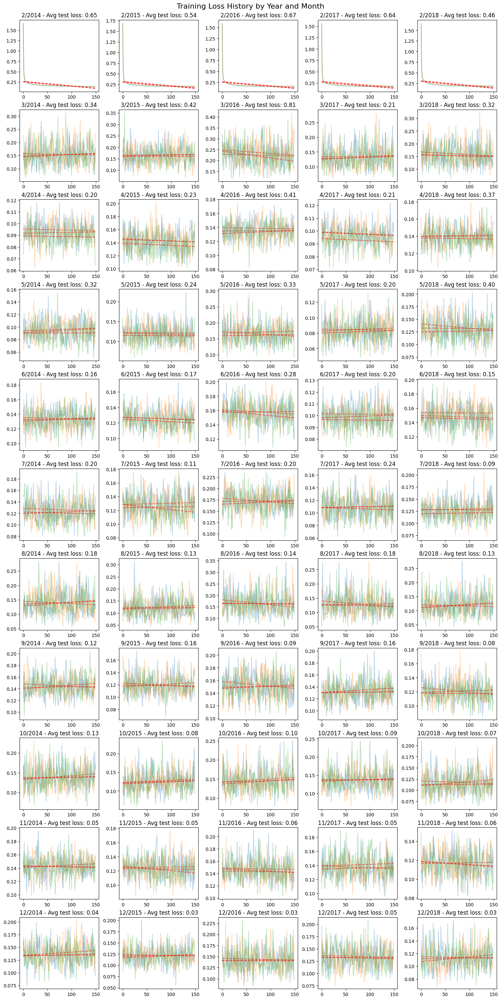

In [73]:
df2_best = df2[(df2['lr']==best_params[0]) & (df2['weight_decay']==best_params[1])]

years = df2_best['test_year'].unique()
months = df2_best['test_month'].unique()
clients = df2_best['client_num'].unique()

# Determine the number of rows and columns for the subplots grid
n_rows = len(months)
n_cols = len(years)

# Create a figure and axes array of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 30), constrained_layout=True)

for j, year in enumerate(years):
    for i, month in enumerate(months):
        ax = axes[i, j] if n_rows > 1 and n_cols > 1 else (axes[j] if n_cols > 1 else axes[i])
        subset = df2_best[(df2_best['test_year'] == year) & (df2_best['test_month'] == month)]
        avg_test_loss = subset['test_loss'].mean()
        
        ax.set_title(f'{month}/{year} - Avg test loss: {avg_test_loss:.2f}')
        for client_num in clients:
            client_data = subset[subset['client_num'] == client_num]
            if not client_data.empty:
                training_loss_history = client_data['training_loss_history'].values[0]
                epochs = np.arange(len(training_loss_history))
                ax.plot(training_loss_history, label=f'Client {client_num}', alpha=0.3)
                
                # Add linear regression line
                if len(epochs) > 1:  # Ensure there are enough data points to fit a line
                    coeffs = np.polyfit(epochs, training_loss_history, 1)
                    linear_fit = np.poly1d(coeffs)
                    ax.plot(epochs, linear_fit(epochs), linestyle='--', color='red', alpha=0.6)

# Add a main title to the figure
fig.suptitle('Training Loss History by Year and Month', fontsize=16)

# Add legend outside the subplots
# handles, labels = ax.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

plt.show()

### 3. Scenario 3
> train with 1 month before prediction month

In [50]:
def FL_scenario3(lr_, weight_decay_, test_year, selected_months=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], verbose=False):

    if verbose:
        print(f'lr: {lr_} - weight_decay: {weight_decay_} - test_year: {test_year}')

    results_list = []

    # Set the random seed
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    torch.manual_seed(random_seed)

    # Define scenario's parameters
    num_epochs = 30
    train_years = [test_year]

    # Define the model
    # global_model = SimpleNN(input_dim=len(train_columns), output_dim=1, hidden_dim=5).to(DEVICE)
    global_model = TwoLayerNN(input_dim=len(train_columns), output_dim=1, hidden_dim1=32, hidden_dim2=32).to(DEVICE)
    for name, param in global_model.named_parameters():
        if 'weight' in name:
            nn.init.xavier_normal_(param)
        if 'bias' in name:
            nn.init.zeros_(param)
            
    # Define the client models
    client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

    # Store training values
    train_losses = {'client_{}'.format(i): {month: [] for month in selected_months} for i in range(NUM_CLIENTS)}
    client_data_stats = {'client_{}'.format(i): {month: {'x_mean': [], 'x_std': [], 'y_mean': [], 'y_std': []}
                                                  for month in selected_months} for i in range(NUM_CLIENTS)}
    client_batched_data = {'client_{}'.format(i): {month: {'x_train': [], 'y_train': []} for month in selected_months} for i in range(NUM_CLIENTS)}

    for month in selected_months[:-1]:

        # Training loop
        for epoch in tqdm(range(num_epochs), desc="Epochs", disable=not verbose):
            
            for client_num in range(NUM_CLIENTS):
                # Each client receives its latest model
                client_model = client_models[client_num]
                client_model.train()

                # Define optimizer and trainer for the client's model
                # optimizer = optim.SGD(
                #     [param for param in client_model.parameters() if param.requires_grad],
                #     lr=lr_,
                #     momentum=0.9,
                #     weight_decay=weight_decay_,
                # )
                
                optimizer = optim.Adam([param for param in client_model.parameters() if param.requires_grad], 
                                       lr=lr_, 
                                       weight_decay=weight_decay_)

                trainer = Trainer(
                    model=client_model,
                    criterion=nn.MSELoss(reduction='none').to(DEVICE),
                    metric=mse,
                    device=DEVICE,
                    optimizer=optimizer,
                    cast_label=False,
                )

                # Get the client's time series data
                time_series_client = time_series[client_num]

                x_train = time_series_client[(time_series_client.year.isin(train_years)) &
                                             (time_series_client.month==month)][train_columns].values
                y_train = time_series_client[(time_series_client.year.isin(train_years)) &
                                             (time_series_client.month==month)]['target'].values

                x_mean, x_std = x_train.mean(axis=0), x_train.std(axis=0)
                y_mean, y_std = y_train.mean(), y_train.std()

                # Store the means and stds for the client and month if not already stored
                if len(client_data_stats['client_{}'.format(client_num)][month]['x_mean']) == 0:
                    client_data_stats['client_{}'.format(client_num)][month]['x_mean'] = x_mean
                    client_data_stats['client_{}'.format(client_num)][month]['x_std'] = x_std
                    client_data_stats['client_{}'.format(client_num)][month]['y_mean'] = y_mean
                    client_data_stats['client_{}'.format(client_num)][month]['y_std'] = y_std

                # Normalize the training data
                x_train = (x_train - x_mean) / x_std
                y_train = (y_train - y_mean) / y_std
                y_train = np.array(y_train).reshape(-1, 1)

                # Create the training dataset and dataloader
                train_dataset = TensorDataset(torch.tensor(x_train), torch.tensor(y_train))
                train_dataloader = DataLoader(train_dataset, batch_size=int(0.1*len(x_train)), shuffle=True)

                ## Loop over all batches
                # for x_batch, y_batch in train_dataloader:
                #     x_batch = x_batch.to(DEVICE).type(torch.float32)
                #     y_batch = y_batch.to(DEVICE).type(torch.float32)

                #     optimizer.zero_grad()

                #     outputs = client_model(x_batch)
                #     loss = trainer.criterion(outputs, y_batch).mean()

                #     loss.backward()

                #     optimizer.step()
                
                ## Only do one pass using 10% of the data
                # Get the first batch
                x_batch, y_batch = next(iter(train_dataloader))
                x_batch = x_batch.to(DEVICE).type(torch.float32)
                y_batch = y_batch.to(DEVICE).type(torch.float32)
                
                # Zero the gradients
                optimizer.zero_grad()
                
                # Forward pass
                outputs = client_model(x_batch)
                loss = trainer.criterion(outputs, y_batch).mean()
                
                # Backward pass
                loss.backward()
                
                # # Print the value of a weight of the client model
                # if epoch % 10 == 0:
                #     print('Client {} weight before:'.format(client_num), client_model.fc1.weight[0][0].item())
                
                # Update the weights
                optimizer.step()
    
                # Store the training loss
                train_losses['client_{}'.format(client_num)][month].append(loss.item())
                
                # Store the batched data
                client_batched_data['client_{}'.format(client_num)][month]['x_train'].append(x_batch.cpu().numpy())
                client_batched_data['client_{}'.format(client_num)][month]['y_train'].append(y_batch.cpu().numpy())
                
                # Print the value of a weight of the client model
                if epoch % 10 == 0:
                    print('Client {} weight after:'.format(client_num), client_model.fc1.weight[0][0].item())
                

            # Average the models and update the global model
            with torch.no_grad():
                global_model_dict = global_model.state_dict()
                for param in global_model_dict.keys():
                    param_sum = sum(client_models[i].state_dict()[param] for i in range(NUM_CLIENTS))
                    global_model_dict[param] = param_sum / NUM_CLIENTS
                global_model.load_state_dict(global_model_dict)
                
            # Check if weights are correctly averaged
            if epoch % 10 == 0:
                print('Global model weight:', global_model.fc1.weight[0][0].item())
            
            # Send the latest global model to each client
            client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

        # Set the model to evaluation mode
        global_model.eval()

        # Test for each client
        for client_num in range(NUM_CLIENTS):
            
            # Get the client's time series data
            time_series_client = time_series[client_num]
            x_test = time_series_client[(time_series_client.year == test_year) &
                                        (time_series_client.month == month + 1)][train_columns].values
            y_test = time_series_client[(time_series_client.year == test_year) &
                                        (time_series_client.month == month + 1)]['target'].values
            
            # Read the means and stds for this client and month
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std']
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std']

            # Normalize the test data
            x_test = (x_test - x_mean) / x_std
            y_test = (y_test - y_mean) / y_std
            y_test = np.array(y_test).reshape(-1, 1)

            # Get the predictions
            with torch.no_grad():
                y_pred = global_model(torch.tensor(x_test).to(DEVICE).type(torch.float32))

            # Compute the test loss
            test_loss = trainer.criterion(y_pred, torch.tensor(y_test).to(DEVICE).type(torch.float32)).mean()

            # Store the results
            result = {
                'lr': lr_,
                'weight_decay': weight_decay_,
                'train_month': month,
                'test_month': month + 1,
                'test_year': test_year,
                'client_num': client_num,
                'train_data': {'x_train': np.array(client_batched_data['client_{}'.format(client_num)][month]['x_train']),
                               'y_train': np.array(client_batched_data['client_{}'.format(client_num)][month]['y_train'])},
                'x_test': x_test * x_std + x_mean,
                'x_test_norm': x_test,
                'y_test': y_test * y_std + y_mean,
                'y_test_norm': y_test,
                'y_pred': y_pred.cpu().numpy() * y_std + y_mean,
                'y_pred_norm': y_pred.cpu().numpy(),
                'test_loss': test_loss.item(),
                'training_loss_history': train_losses['client_{}'.format(client_num)][month]
            }

            results_list.append(result)

    return results_list

In [61]:
# Define the values for lr, weight_decay, and test_year
# lr_values = [0.0001, 0.001, 0.01] 
# weight_decay_values = [5e-3, 5e-2, 0.1, 0.25]
# test_years = [2016, 2017, 2018]

lr_values = [0.01]
weight_decay_values = [5e-4]
test_year_values = [2014, 2015, 2016, 2017, 2018]

results_dict = {}

# Define the total number of iterations
total_iterations = len(lr_values) * len(weight_decay_values) * len(test_year_values)

with tqdm(total=total_iterations, desc="Progress") as pbar:
    for lr in lr_values:
        for weight_decay in weight_decay_values:
            for test_year in test_year_values:
                key = (lr, weight_decay, test_year)
                results_dict[key] = pd.DataFrame(FL_scenario3(lr, weight_decay, test_year, verbose=False))
                pbar.update(1)  # Update the progress bar
            
# Concatenate DataFrames for different configurations into a single DataFrame
final_df = pd.concat(results_dict.values(), ignore_index=True)

# Export to json
# final_df.to_json('FL_results/FL_scenario3_40clients.json')

final_df.sample(3)

Progress:   0%|          | 0/5 [00:00<?, ?it/s]

Client 0 weight after: -0.1051214188337326
Client 1 weight after: -0.1051214188337326
Client 2 weight after: -0.1051214188337326
Client 3 weight after: -0.1051214188337326
Client 4 weight after: -0.1051214188337326
Client 5 weight after: -0.1051214188337326
Client 6 weight after: -0.1051214188337326
Client 7 weight after: -0.1051214188337326
Client 8 weight after: -0.1051214188337326
Client 9 weight after: -0.1051214188337326
Client 10 weight after: -0.1051214188337326
Client 11 weight after: -0.1051214188337326
Client 12 weight after: -0.1051214188337326
Client 13 weight after: -0.1051214188337326
Client 14 weight after: -0.1051214188337326
Client 15 weight after: -0.1051214188337326
Client 16 weight after: -0.1051214188337326
Client 17 weight after: -0.1051214188337326
Client 18 weight after: -0.1051214188337326
Client 19 weight after: -0.1051214188337326
Client 20 weight after: -0.1051214188337326
Client 21 weight after: -0.1051214188337326
Client 22 weight after: -0.105121418833732

Progress:  20%|██        | 1/5 [00:25<01:42, 25.53s/it]

Client 0 weight after: -0.1051214188337326
Client 1 weight after: -0.1051214188337326
Client 2 weight after: -0.1051214188337326
Client 3 weight after: -0.1051214188337326
Client 4 weight after: -0.1051214188337326
Client 5 weight after: -0.1051214188337326
Client 6 weight after: -0.1051214188337326
Client 7 weight after: -0.1051214188337326
Client 8 weight after: -0.1051214188337326
Client 9 weight after: -0.1051214188337326
Client 10 weight after: -0.1051214188337326
Client 11 weight after: -0.1051214188337326
Client 12 weight after: -0.1051214188337326
Client 13 weight after: -0.1051214188337326
Client 14 weight after: -0.1051214188337326
Client 15 weight after: -0.1051214188337326
Client 16 weight after: -0.1051214188337326
Client 17 weight after: -0.1051214188337326
Client 18 weight after: -0.1051214188337326
Client 19 weight after: -0.1051214188337326
Client 20 weight after: -0.1051214188337326
Client 21 weight after: -0.1051214188337326
Client 22 weight after: -0.105121418833732

Progress:  40%|████      | 2/5 [00:50<01:14, 25.00s/it]

Client 0 weight after: -0.1051214188337326
Client 1 weight after: -0.1051214188337326
Client 2 weight after: -0.1051214188337326
Client 3 weight after: -0.1051214188337326
Client 4 weight after: -0.1051214188337326
Client 5 weight after: -0.10512141138315201
Client 6 weight after: -0.1051214188337326
Client 7 weight after: -0.1051214188337326
Client 8 weight after: -0.1051214188337326
Client 9 weight after: -0.1051214188337326
Client 10 weight after: -0.1051214188337326
Client 11 weight after: -0.1051214188337326
Client 12 weight after: -0.1051214188337326
Client 13 weight after: -0.1051214188337326
Client 14 weight after: -0.1051214188337326
Client 15 weight after: -0.1051214188337326
Client 16 weight after: -0.1051214188337326
Client 17 weight after: -0.1051214188337326
Client 18 weight after: -0.1051214188337326
Client 19 weight after: -0.1051214188337326
Client 20 weight after: -0.1051214188337326
Client 21 weight after: -0.1051214188337326
Client 22 weight after: -0.10512141883373

Progress:  60%|██████    | 3/5 [01:14<00:49, 24.87s/it]

Client 0 weight after: -0.1051214188337326
Client 1 weight after: -0.1051214188337326
Client 2 weight after: -0.1051214188337326
Client 3 weight after: -0.1051214188337326
Client 4 weight after: -0.1051214188337326
Client 5 weight after: -0.1051214188337326
Client 6 weight after: -0.1051214188337326
Client 7 weight after: -0.1051214188337326
Client 8 weight after: -0.1051214188337326
Client 9 weight after: -0.1051214188337326
Client 10 weight after: -0.1051214188337326
Client 11 weight after: -0.1051214188337326
Client 12 weight after: -0.1051214188337326
Client 13 weight after: -0.1051214188337326
Client 14 weight after: -0.1051214188337326
Client 15 weight after: -0.1051214188337326
Client 16 weight after: -0.1051214188337326
Client 17 weight after: -0.1051214188337326
Client 18 weight after: -0.1051214188337326
Client 19 weight after: -0.1051214188337326
Client 20 weight after: -0.1051214188337326
Client 21 weight after: -0.1051214188337326
Client 22 weight after: -0.105121418833732

Progress:  80%|████████  | 4/5 [01:39<00:24, 24.73s/it]

Client 0 weight after: -0.1051214188337326
Client 1 weight after: -0.1051214188337326
Client 2 weight after: -0.1051214188337326
Client 3 weight after: -0.1051214188337326
Client 4 weight after: -0.1051214188337326
Client 5 weight after: -0.10512139648199081
Client 6 weight after: -0.1051214188337326
Client 7 weight after: -0.1051214188337326
Client 8 weight after: -0.1051214188337326
Client 9 weight after: -0.1051214188337326
Client 10 weight after: -0.1051214188337326
Client 11 weight after: -0.1051214188337326
Client 12 weight after: -0.1051214188337326
Client 13 weight after: -0.1051214188337326
Client 14 weight after: -0.1051214188337326
Client 15 weight after: -0.1051214188337326
Client 16 weight after: -0.1051214188337326
Client 17 weight after: -0.1051214188337326
Client 18 weight after: -0.1051214188337326
Client 19 weight after: -0.1051214188337326
Client 20 weight after: -0.1051214188337326
Client 21 weight after: -0.1051214188337326
Client 22 weight after: -0.10512141883373

Progress: 100%|██████████| 5/5 [02:04<00:00, 24.81s/it]


,lr,weight_decay,train_month,test_month,test_year,client_num,train_data,x_test,x_test_norm,y_test,y_test_norm,y_pred,y_pred_norm,test_loss,training_loss_history
1237,0.01,0.0005,9,10,2016,37,{'x_train': [[[ 0.6725385 -0.8247995 -0.1501...,"[[24.9, 20.291675617786552, 0.0796113248133003...","[[-0.5385457720140963, 0.10050212567149493, -0...","[[3.221871836255792], [6.274503794282673], [8....","[[-1.0712412719756153], [-0.7626870113088692],...","[[8.111589], [8.684637], [10.005562], [9.09614...","[[-0.5769979], [-0.5190754], [-0.38555878], [-...",0.147026,"[0.10627742111682892, 0.08926120400428772, 0.1..."
2045,0.01,0.0005,8,9,2018,5,{'x_train': [[[ 1.0287541 1.3136692 -1.2155...,"[[32.49, 9.938438595716562, 1.9121289890711513...","[[-0.6706062084619857, -2.1285373954664624, 0....","[[39.42842366289604], [20.435513215860972], [2...","[[-0.7252785389553632], [-1.1917125617176596],...","[[43.22962], [55.818542], [33.667664], [34.353...","[[-0.6319275], [-0.32276475], [-0.8667531], [-...",0.110767,"[0.20332032442092896, 0.2413749396800995, 0.09..."
1282,0.01,0.0005,11,12,2016,2,{'x_train': [[[-1.5763568 1.0773548 -0.3408...,"[[9.07, 1.252226648188147, 1.9842076635561003,...","[[-0.5936956202459165, -1.2876508255655283, 0....","[[35.0356759192757], [76.71685627922677], [111...","[[0.05179063016102458], [1.2407695109673684], ...","[[18.10479], [52.79847], [89.94513], [110.1794...","[[-0.43117237], [0.5584842], [1.6181134], [2.1...",0.153195,"[0.2995772361755371, 0.2409067451953888, 0.293..."


In [67]:
# Compute best results from Scenario 3
df3 = pd.read_json('FL_results/FL_scenario3_40clients.json')
# df3 = final_df

# compute nbr of gs values
nbr_gs_values = len(df3['lr'].unique()) * len(df3['weight_decay'].unique())
print(f'Scenario 3 tested with {nbr_gs_values} different hyperparameters combinations and {len(df3.client_num.unique())} clients')

best_params = df3.groupby(['lr', 'weight_decay'])['test_loss'].mean().idxmin()

print(f'Best parameters: lr={best_params[0]}, weight_decay={best_params[1]}')

display(df3[(df3['lr']==best_params[0]) & (df3['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean())

print('Overall loss over 5 years: %.3f ± %.3f' % (df3[(df3['lr']==best_params[0]) & (df3['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.mean(), df3[(df3['lr']==best_params[0]) & (df3['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.std()))

Scenario 3 tested with 9 different hyperparameters combinations and 40 clients
Best parameters: lr=0.1, weight_decay=0.05


test_year
2014    0.247535
2015    0.251238
2016    0.273944
2017    0.253578
2018    0.206057
Name: test_loss, dtype: float64

Overall loss over 5 years: 0.246 ± 0.022


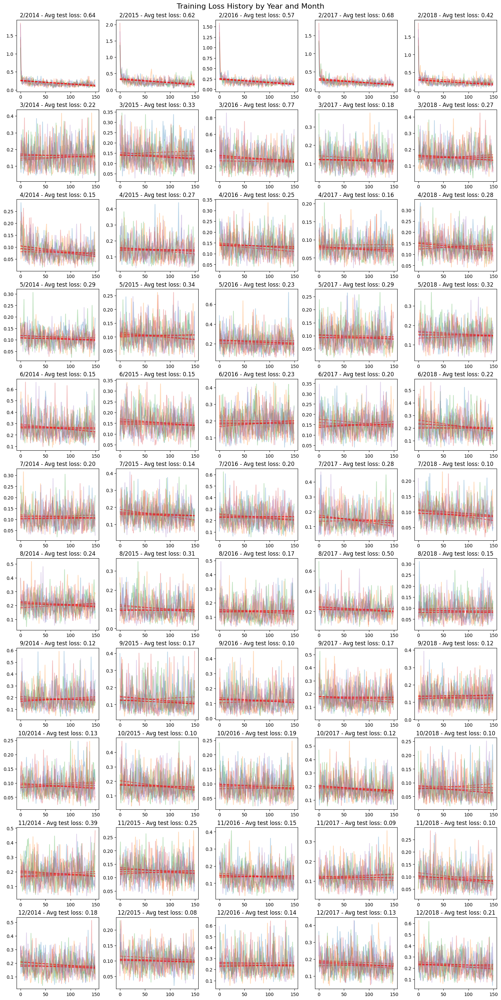

In [68]:
df3_best = df3[(df3['lr']==best_params[0]) & (df3['weight_decay']==best_params[1])]

years = df3_best['test_year'].unique()
months = df3_best['test_month'].unique()
clients = df3_best['client_num'].unique()

# Determine the number of rows and columns for the subplots grid
n_rows = len(months)
n_cols = len(years)

# Create a figure and axes array of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 30), constrained_layout=True)

for j, year in enumerate(years):
    for i, month in enumerate(months):
        ax = axes[i, j] if n_rows > 1 and n_cols > 1 else (axes[j] if n_cols > 1 else axes[i])
        subset = df3_best[(df3_best['test_year'] == year) & (df3_best['test_month'] == month)]
        avg_test_loss = subset['test_loss'].mean()
        
        ax.set_title(f'{month}/{year} - Avg test loss: {avg_test_loss:.2f}')
        for client_num in clients[:5]:
            client_data = subset[subset['client_num'] == client_num]
            if not client_data.empty:
                training_loss_history = client_data['training_loss_history'].values[0]
                epochs = np.arange(len(training_loss_history))
                ax.plot(training_loss_history, label=f'Client {client_num}', alpha=0.3)
                
                # Add linear regression line
                if len(epochs) > 1:  # Ensure there are enough data points to fit a line
                    coeffs = np.polyfit(epochs, training_loss_history, 1)
                    linear_fit = np.poly1d(coeffs)
                    ax.plot(epochs, linear_fit(epochs), linestyle='--', color='red', alpha=0.6)

# Add a main title to the figure
fig.suptitle('Training Loss History by Year and Month', fontsize=16)

# Add legend outside the subplots
# handles, labels = ax.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

plt.show()

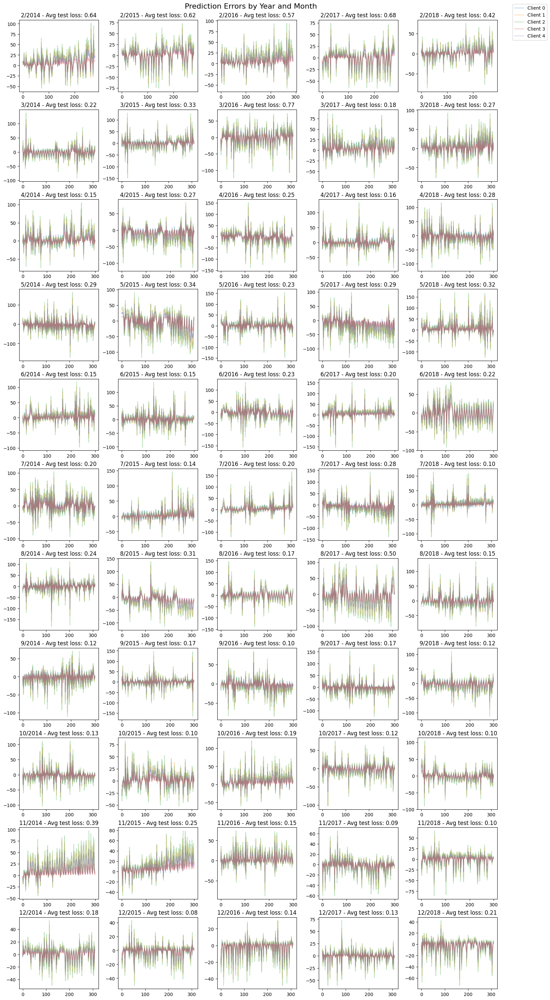

In [70]:
years = df3_best['test_year'].unique()
months = df3_best['test_month'].unique()
clients = df3_best['client_num'].unique()

# Determine the number of rows and columns for the subplots grid
n_rows = len(months)
n_cols = len(years)

# Create a figure and axes array of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 30), constrained_layout=True)

for j, year in enumerate(years):
    for i, month in enumerate(months):
        ax = axes[i, j] if n_rows > 1 and n_cols > 1 else (axes[j] if n_cols > 1 else axes[i])
        subset = df3_best[(df3_best['test_year'] == year) & (df3_best['test_month'] == month)]
        avg_test_loss = subset['test_loss'].mean()
        
        ax.set_title(f'{month}/{year} - Avg test loss: {avg_test_loss:.2f}')
        for client_num in clients[:5]:
            client_data = subset[subset['client_num'] == client_num]
            if not client_data.empty:
                error = np.array(client_data['y_pred'].values[0]) - np.array(client_data['y_true'].values[0])
                ax.plot(error, label=f'Client {client_num}', alpha=0.3)

# Add a main title to the figure
fig.suptitle('Prediction Errors by Year and Month', fontsize=16)

# Add legend outside the subplots
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

plt.show()

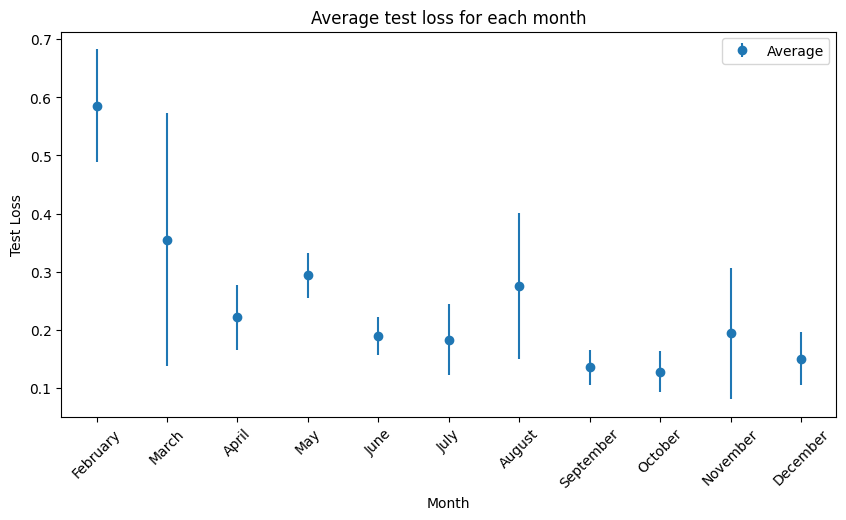

In [71]:
plt.figure(figsize=(10, 5))
plt.errorbar(np.arange(2, 13), df3_best.groupby('test_month')['test_loss'].mean(), yerr=df3_best.groupby('test_month')['test_loss'].std(), fmt='o', label='Average')
plt.title('Average test loss for each month')
plt.xticks(np.arange(2, 13), [months_name[i] for i in np.arange(2, 13)], rotation=45)
plt.legend()
plt.xlabel('Month')
plt.ylabel('Test Loss')
plt.show()

In [ ]:
# Training features at given epoch for 10 clients
for col in range(10): # 10 features
    plt.figure(figsize=(15, 2))
    for client in range(10): 
        plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==client)]['train_data'].values[0]['x_train'][10,:,col], label=f'Client {client}', alpha=0.5)
        # plt.legend()

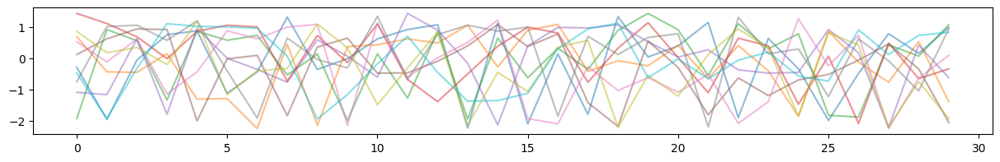

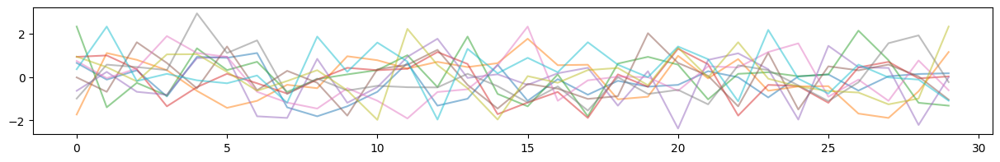

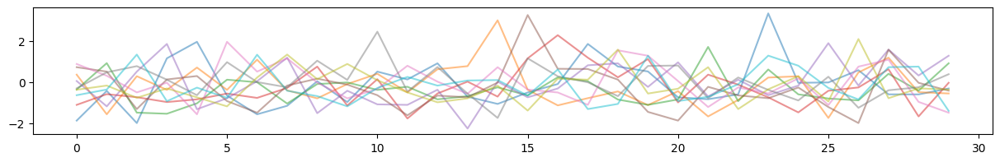

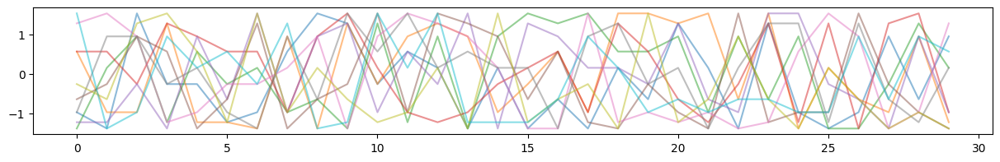

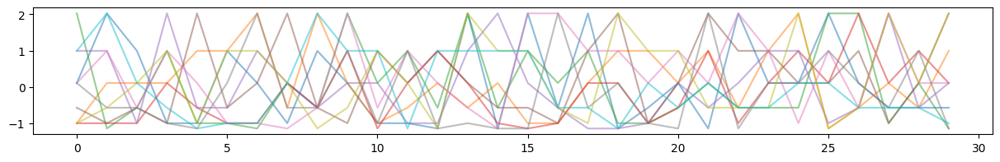

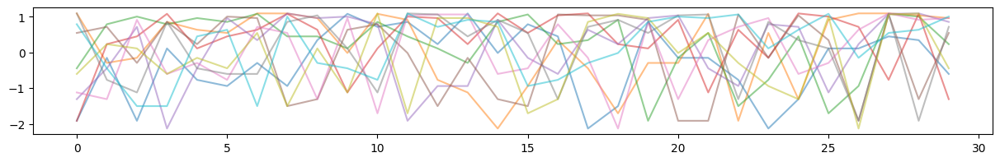

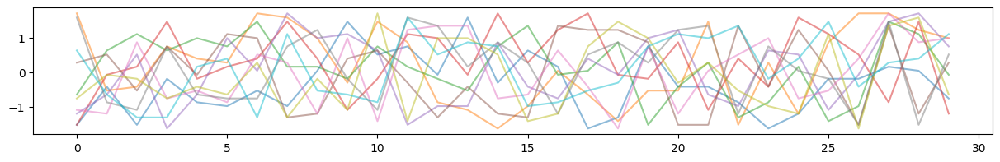

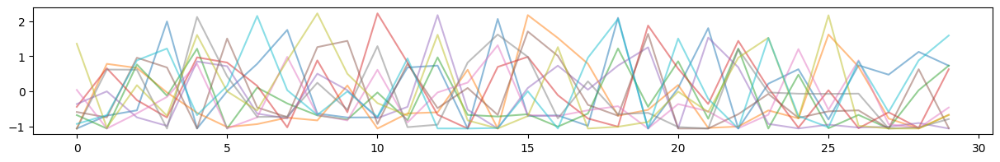

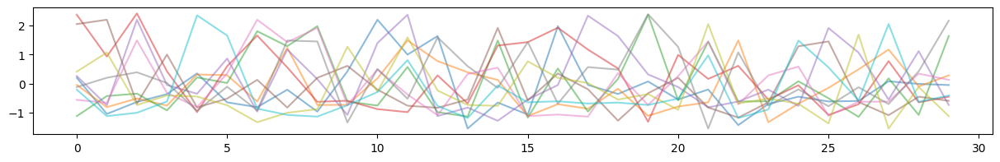

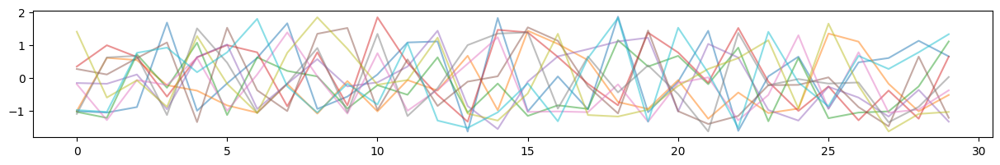

In [57]:
# Training features for 1 client for 10 epochs
for col in range(10): # 10 features
    plt.figure(figsize=(15, 2))
    for epoch in range(10): # Each epoch has the same training data, but we batch it differently
        plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==10)]['train_data'].values[0]['x_train'][epoch,:,col], label=f'Epoch {epoch}', alpha=0.5)
        # plt.legend()

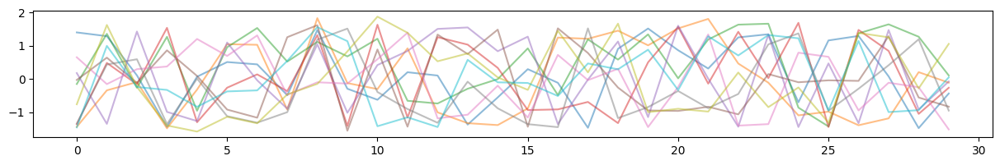

In [58]:
# Training target for 10 clients at a given epoch
plt.figure(figsize=(15, 2))
for client in range(10):
    plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==client)]['train_data'].values[0]['y_train'][10], label=f'Client {client}', alpha=0.5)
    # plt.legend()

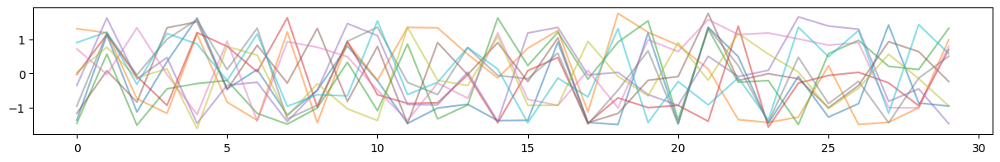

In [59]:
# Training target for 1 client for 10 epochs
plt.figure(figsize=(15, 2))
for epoch in range(10):
    plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==20)]['train_data'].values[0]['y_train'][epoch], label=f'Epoch {epoch}', alpha=0.5)
    # plt.legend()
    

> Each client has different data at each epoch -> Why are the weights almost always the same for all clients after 1 training round ?

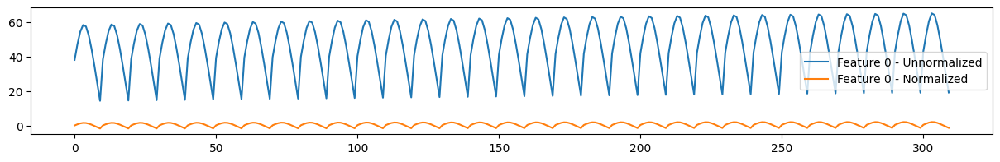

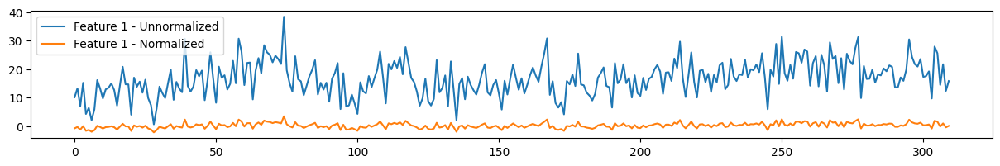

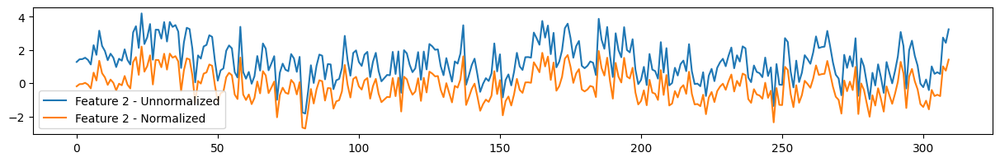

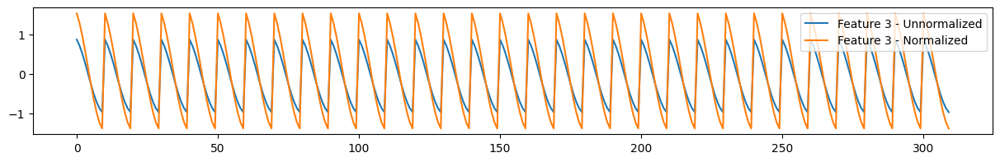

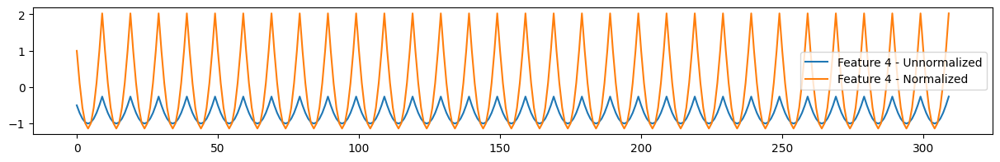

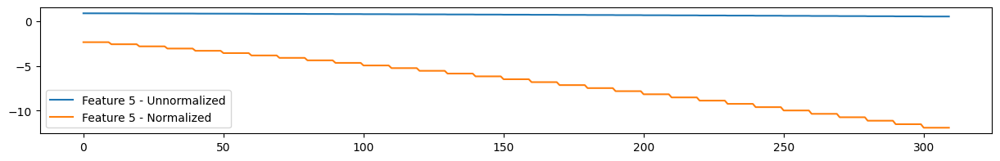

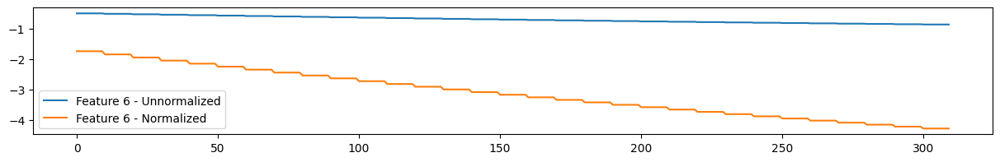

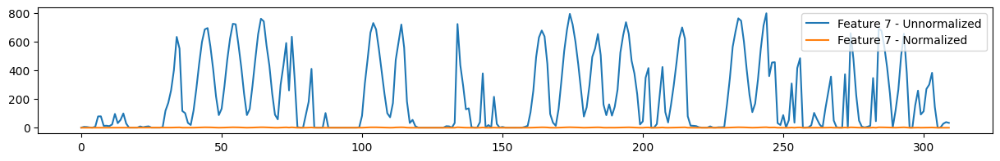

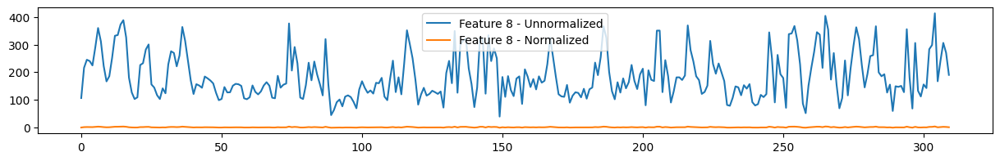

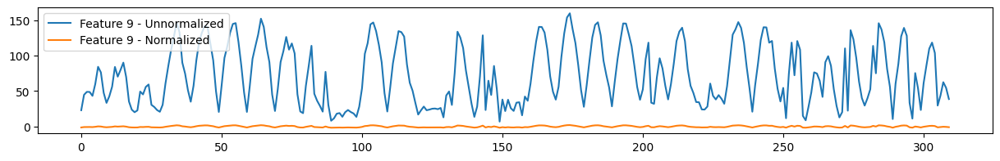

In [11]:
# Testing features
for col in range(10):
    plt.figure(figsize=(15, 2))
    plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['x_test'].values[0][:, col], label=f'Feature {col} - Unnormalized')
    plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['x_test_norm'].values[0][:, col], label=f'Feature {col} - Normalized')
    plt.legend()

In [12]:
# Not exactly N(0,1) because we use means and stds computed from the training data
display(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['x_test_norm'].values[0].mean(axis=0))
display(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['x_test_norm'].values[0].std(axis=0))

array([ 5.44280815e-01,  2.14169116e-01, -1.52915855e-01, -1.57580042e-17,
        3.46676093e-16, -6.72471176e+00, -3.11974131e+00, -1.21158801e-01,
        1.67971689e-01, -9.74518735e-02])

array([1.06877838, 0.90658739, 0.89710478, 1.        , 1.        ,
       2.86937519, 0.76576527, 1.05260484, 0.98924708, 1.02001911])

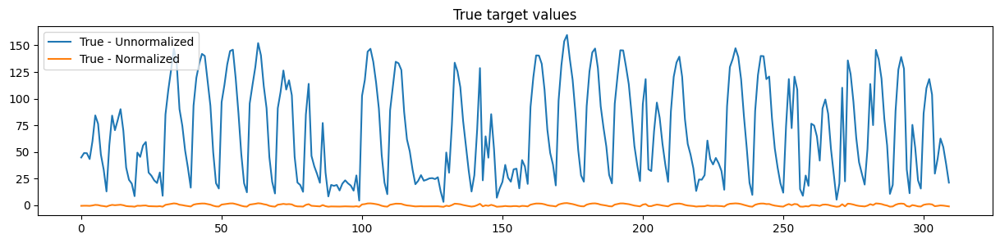

In [13]:
plt.figure(figsize=(15, 3))
plt.title('True target values')
plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['y_test'].values[0], label='True - Unnormalized')
plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['y_test_norm'].values[0], label='True - Normalized')
plt.legend()
plt.show()

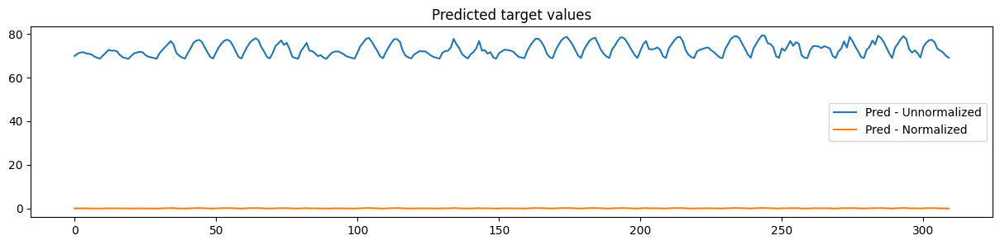

In [14]:
plt.figure(figsize=(15, 3))
plt.title('Predicted target values')
plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['y_pred'].values[0], label='Pred - Unnormalized')
plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['y_pred_norm'].values[0], label='Pred - Normalized')
plt.legend()
plt.show()

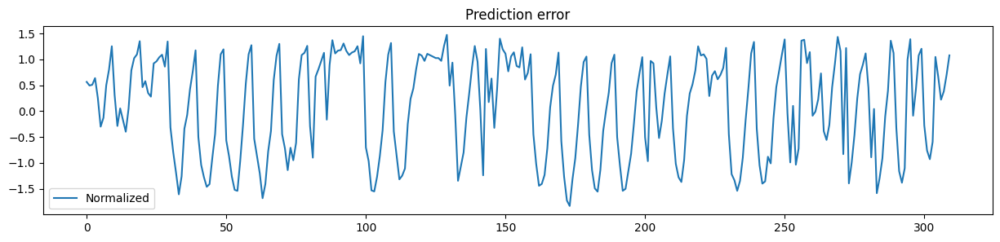

In [15]:
plt.figure(figsize=(15, 3))
plt.title('Prediction error')
# plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['y_pred'].values[0] - df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['y_test'].values[0], label='Unnormalized')
plt.plot(df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['y_pred_norm'].values[0] - df3_best[(df3_best['test_year']==2018) & (df3_best['test_month']==5) & (df3_best['client_num']==0)]['y_test_norm'].values[0], label='Normalized')
plt.legend()
plt.show()

### 4. Scenario 4
> train with 2 months before prediction month

In [6]:
def FL_scenario4(lr_, weight_decay_, test_year, selected_months=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], verbose=False):

    if verbose:
        print(f'lr: {lr_} - weight_decay: {weight_decay_} - test_year: {test_year}')

    results_list = []

    # Set the random seed
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    torch.manual_seed(random_seed)

    # Define scenario's parameters
    num_epochs = 150
    train_years = [test_year]

    # Define the model
    global_model = TwoLayerNN(input_dim=len(train_columns), output_dim=1, hidden_dim1=32, hidden_dim2=32).to(DEVICE)
    for name, param in global_model.named_parameters():
        if 'weight' in name:
            nn.init.xavier_normal_(param)
        if 'bias' in name:
            nn.init.zeros_(param)

    # Define the client models
    client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

    # Store training values
    train_losses = {'client_{}'.format(i): {month: [] for month in selected_months} for i in range(NUM_CLIENTS)}
    client_data_stats = {'client_{}'.format(i): {month: {'x_mean': [], 'x_std': [], 'y_mean': [], 'y_std': []}
                                                  for month in selected_months} for i in range(NUM_CLIENTS)}

    for month in selected_months[:-2]:
        # Training loop
        for epoch in tqdm(range(num_epochs), desc="Epochs", disable=not verbose):
            # Ensure each client starts with the latest global model
            # client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]
            
            for client_num in range(NUM_CLIENTS):
                client_model = client_models[client_num]
                client_model.train()

                optimizer = optim.SGD(
                    [param for param in client_model.parameters() if param.requires_grad],
                    lr=lr_,
                    momentum=0.9,
                    weight_decay=weight_decay_,
                )

                trainer = Trainer(
                    model=client_model,
                    criterion=nn.MSELoss(reduction='none').to(DEVICE),
                    metric=mse,
                    device=DEVICE,
                    optimizer=optimizer,
                    cast_label=False,
                )

                time_series_client = time_series[client_num]

                x_train = time_series_client[(time_series_client.year.isin(train_years)) &
                                             (time_series_client.month.isin([month, month+1]))][train_columns].values
                y_train = time_series_client[(time_series_client.year.isin(train_years)) &
                                             (time_series_client.month.isin([month, month+1]))]['target'].values

                x_mean, x_std = x_train.mean(axis=0), x_train.std(axis=0)
                y_mean, y_std = y_train.mean(), y_train.std()

                if len(client_data_stats['client_{}'.format(client_num)][month]['x_mean']) == 0:
                    client_data_stats['client_{}'.format(client_num)][month]['x_mean'].append(x_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['x_std'].append(x_std)
                    client_data_stats['client_{}'.format(client_num)][month]['y_mean'].append(y_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['y_std'].append(y_std)

                x_train = (x_train - x_mean) / x_std
                y_train = (y_train - y_mean) / y_std
                y_train = np.array(y_train).reshape(-1, 1)

                train_dataset = TensorDataset(torch.tensor(x_train), torch.tensor(y_train))
                train_dataloader = DataLoader(train_dataset, batch_size=int(0.05*len(x_train)), shuffle=True)

                # for x_batch, y_batch in train_dataloader:
                #     x_batch = x_batch.to(DEVICE).type(torch.float32)
                #     y_batch = y_batch.to(DEVICE).type(torch.float32)

                #     optimizer.zero_grad()

                #     outputs = client_model(x_batch)
                #     loss = trainer.criterion(outputs, y_batch).mean()

                #     loss.backward()

                #     optimizer.step()
                
                # Only do one pass using 10% of the data
                x_batch, y_batch = next(iter(train_dataloader))
                x_batch = x_batch.to(DEVICE).type(torch.float32)
                y_batch = y_batch.to(DEVICE).type(torch.float32)
                
                optimizer.zero_grad()
                
                outputs = client_model(x_batch)
                
                loss = trainer.criterion(outputs, y_batch).mean()

                train_losses['client_{}'.format(client_num)][month].append(loss.item())

            with torch.no_grad():
                global_model_dict = global_model.state_dict()
                for param in global_model_dict.keys():
                    param_sum = sum(client_models[i].state_dict()[param] for i in range(NUM_CLIENTS))
                    global_model_dict[param] = param_sum / NUM_CLIENTS
                global_model.load_state_dict(global_model_dict)

            client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

        # Store the means and stds for this client and month
        for client_num in range(NUM_CLIENTS):
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std'][0]
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std'][0]

            client_data_stats['client_{}'.format(client_num)][month]['x_mean'] = x_mean
            client_data_stats['client_{}'.format(client_num)][month]['x_std'] = x_std
            client_data_stats['client_{}'.format(client_num)][month]['y_mean'] = y_mean
            client_data_stats['client_{}'.format(client_num)][month]['y_std'] = y_std

        # Set the model to evaluation mode
        global_model.eval()

        # Test for each client
        for client_num in range(NUM_CLIENTS):
            time_series_client = time_series[client_num]
            x_test = time_series_client[(time_series_client.year == test_year) &
                                        (time_series_client.month == month+2)][train_columns].values
            y_test = time_series_client[(time_series_client.year == test_year) &
                                        (time_series_client.month == month+2)]['target'].values
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std']
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std']

            x_test = (x_test - x_mean) / x_std
            y_test = (y_test - y_mean) / y_std
            y_test = np.array(y_test).reshape(-1, 1)

            with torch.no_grad():
                y_pred = global_model(torch.tensor(x_test).to(DEVICE).type(torch.float32))

            test_loss = trainer.criterion(y_pred, torch.tensor(y_test).to(DEVICE).type(torch.float32)).mean()

            # Store the results
            result = {
                'lr': lr_,
                'weight_decay': weight_decay_,
                'train_month': [month, month+1],
                'test_month': month+2,
                'test_year': test_year,
                'client_num': client_num,
                'y_true': y_test * y_std + y_mean,
                'y_pred': y_pred.cpu().numpy() * y_std + y_mean,
                'test_loss': test_loss.item(),
                'training_loss_history': train_losses['client_{}'.format(client_num)][month]
            }

            results_list.append(result)

    return results_list

In [ ]:
# Define the values for lr, weight_decay, and test_year
lr_values = [0.001, 0.01, 0.1] 
weight_decay_values = [5e-4, 5e-3, 5e-2]
test_year_values = [2014, 2015, 2016, 2017, 2018]

results_dict = {}

# Define the total number of iterations
total_iterations = len(lr_values) * len(weight_decay_values) * len(test_year_values)

with tqdm(total=total_iterations, desc="Progress") as pbar:
    for lr in lr_values:
        for weight_decay in weight_decay_values:
            for test_year in test_year_values:
                key = (lr, weight_decay, test_year)
                results_dict[key] = pd.DataFrame(FL_scenario4(lr, weight_decay, test_year))
                pbar.update(1)  # Update the progress bar
            
# Concatenate DataFrames for different configurations into a single DataFrame
final_df = pd.concat(results_dict.values(), ignore_index=True)

# Export to json
final_df.to_json('FL_results/FL_scenario4_40clients.json')

final_df.sample(3)

In [ ]:
# Compute best results from Scenario 4
df4 = pd.read_json('FL_results/FL_scenario4_clients.json')

# compute nbr of gs values
nbr_gs_values = len(df4['lr'].unique()) * len(df4['weight_decay'].unique())
print(f'Scenario 4 tested with {nbr_gs_values} different hyperparameters combinations and {len(df4.client_num.unique())} clients')

best_params = df4.groupby(['lr', 'weight_decay'])['test_loss'].mean().idxmin()

print(f'Best parameters: lr={best_params[0]}, weight_decay={best_params[1]}')

display(df4[(df4['lr']==best_params[0]) & (df4['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean())

print('Overall loss over 3 years: %.3f ± %.3f' % (df4[(df4['lr']==best_params[0]) & (df4['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.mean(), df4[(df4['lr']==best_params[0]) & (df4['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.std()))

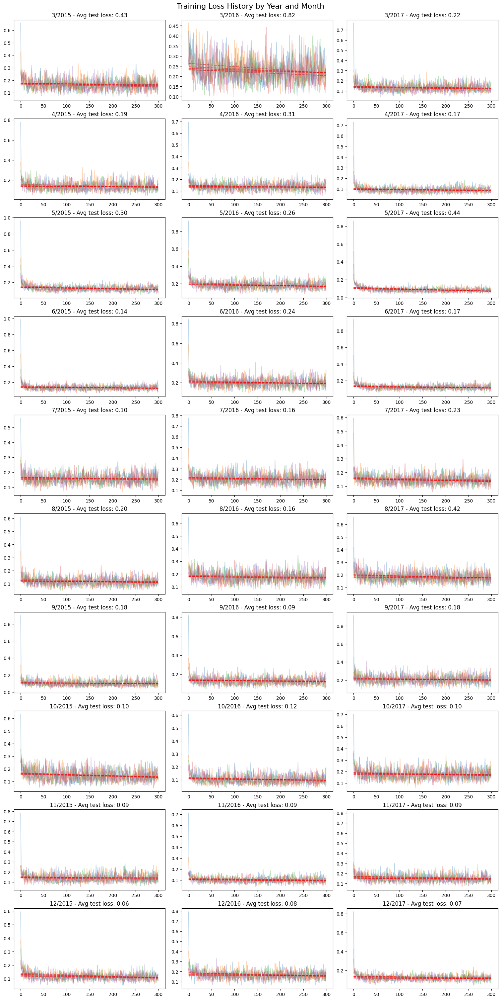

In [4]:
df4_best = df4[(df4['lr']==best_params[0]) & (df4['weight_decay']==best_params[1])]

years = df4_best['test_year'].unique()
months = df4_best['test_month'].unique()
clients = df4_best['client_num'].unique()

# Determine the number of rows and columns for the subplots grid
n_rows = len(months)
n_cols = len(years)

# Create a figure and axes array of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 30), constrained_layout=True)

for j, year in enumerate(years):
    for i, month in enumerate(months):
        ax = axes[i, j] if n_rows > 1 and n_cols > 1 else (axes[j] if n_cols > 1 else axes[i])
        subset = df4_best[(df4_best['test_year'] == year) & (df4_best['test_month'] == month)]
        avg_test_loss = subset['test_loss'].mean()
        
        ax.set_title(f'{month}/{year} - Avg test loss: {avg_test_loss:.2f}')
        for client_num in clients:
            client_data = subset[subset['client_num'] == client_num]
            if not client_data.empty:
                training_loss_history = client_data['training_loss_history'].values[0]
                epochs = np.arange(len(training_loss_history))
                ax.plot(training_loss_history, label=f'Client {client_num}', alpha=0.3)
                
                # Add linear regression line
                if len(epochs) > 1:  # Ensure there are enough data points to fit a line
                    coeffs = np.polyfit(epochs, training_loss_history, 1)
                    linear_fit = np.poly1d(coeffs)
                    ax.plot(epochs, linear_fit(epochs), linestyle='--', color='red', alpha=0.6)

# Add a main title to the figure
fig.suptitle('Training Loss History by Year and Month', fontsize=16)

# Add legend outside the subplots
# handles, labels = ax.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

plt.show()

### 5. Scenario 5
> train with all data from prediction month of previous years

In [ ]:
def FL_scenario5(lr_, weight_decay_, test_year, selected_months=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], verbose=False):

    if verbose:
        print(f'lr: {lr_} - weight_decay: {weight_decay_} - test_year: {test_year}')

    results_list = []

    # Set the random seed
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    torch.manual_seed(random_seed)

    # Define scenario's parameters
    num_epochs = 300
    train_years = np.arange(2005, test_year, 1)

    # Define the model
    global_model = TwoLayerNN(input_dim=len(train_columns), output_dim=1, hidden_dim1=32, hidden_dim2=32).to(DEVICE)
    for name, param in global_model.named_parameters():
        if 'weight' in name:
            nn.init.xavier_normal_(param)
        if 'bias' in name:
            nn.init.zeros_(param)

    # Define the client models
    client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

    # Store training values
    train_losses = {'client_{}'.format(i): {month: [] for month in selected_months} for i in range(NUM_CLIENTS)}
    client_data_stats = {'client_{}'.format(i): {month: {'x_mean': [], 'x_std': [], 'y_mean': [], 'y_std': []}
                                                  for month in selected_months} for i in range(NUM_CLIENTS)}

    for month in selected_months:
        # Training loop
        for epoch in tqdm(range(num_epochs), desc="Epochs", disable=not verbose):
            
            # Ensure each client starts with the latest global model
            client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]
            
            for client_num in range(NUM_CLIENTS):
                client_model = client_models[client_num]
                client_model.train()

                optimizer = optim.SGD(
                    [param for param in client_model.parameters() if param.requires_grad],
                    lr=lr_,
                    momentum=0.9,
                    weight_decay=weight_decay_,
                )

                trainer = Trainer(
                    model=client_model,
                    criterion=nn.MSELoss(reduction='none').to(DEVICE),
                    metric=mse,
                    device=DEVICE,
                    optimizer=optimizer,
                    cast_label=False,
                )

                time_series_client = time_series[client_num]

                x_train = time_series_client[(time_series_client.year.isin(train_years)) &
                                             (time_series_client.month==month)][train_columns].values
                y_train = time_series_client[(time_series_client.year.isin(train_years)) &
                                             (time_series_client.month==month)]['target'].values

                x_mean, x_std = x_train.mean(axis=0), x_train.std(axis=0)
                y_mean, y_std = y_train.mean(), y_train.std()

                if len(client_data_stats['client_{}'.format(client_num)][month]['x_mean']) == 0:
                    client_data_stats['client_{}'.format(client_num)][month]['x_mean'].append(x_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['x_std'].append(x_std)
                    client_data_stats['client_{}'.format(client_num)][month]['y_mean'].append(y_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['y_std'].append(y_std)

                x_train = (x_train - x_mean) / x_std
                y_train = (y_train - y_mean) / y_std
                y_train = np.array(y_train).reshape(-1, 1)

                train_dataset = TensorDataset(torch.tensor(x_train), torch.tensor(y_train))
                train_dataloader = DataLoader(train_dataset, batch_size=512, shuffle=True)

                for x_batch, y_batch in train_dataloader:
                    x_batch = x_batch.to(DEVICE).type(torch.float32)
                    y_batch = y_batch.to(DEVICE).type(torch.float32)

                    optimizer.zero_grad()

                    outputs = client_model(x_batch)
                    loss = trainer.criterion(outputs, y_batch).mean()

                    loss.backward()

                    optimizer.step()

                train_losses['client_{}'.format(client_num)][month].append(loss.item())

            with torch.no_grad():
                global_model_dict = global_model.state_dict()
                for param in global_model_dict.keys():
                    param_sum = sum(client_models[i].state_dict()[param] for i in range(NUM_CLIENTS))
                    global_model_dict[param] = param_sum / NUM_CLIENTS
                global_model.load_state_dict(global_model_dict)

            client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

        # Store the means and stds for this client and month
        for client_num in range(NUM_CLIENTS):
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std'][0]
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std'][0]

            client_data_stats['client_{}'.format(client_num)][month]['x_mean'] = x_mean
            client_data_stats['client_{}'.format(client_num)][month]['x_std'] = x_std
            client_data_stats['client_{}'.format(client_num)][month]['y_mean'] = y_mean
            client_data_stats['client_{}'.format(client_num)][month]['y_std'] = y_std

        # Set the model to evaluation mode
        global_model.eval()

        # Test for each client
        for client_num in range(NUM_CLIENTS):
            time_series_client = time_series[client_num]
            x_test = time_series_client[(time_series_client.year == test_year) &
                                        (time_series_client.month == month)][train_columns].values
            y_test = time_series_client[(time_series_client.year == test_year) &
                                        (time_series_client.month == month)]['target'].values
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std']
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std']

            x_test = (x_test - x_mean) / x_std
            y_test = (y_test - y_mean) / y_std
            y_test = np.array(y_test).reshape(-1, 1)

            with torch.no_grad():
                y_pred = global_model(torch.tensor(x_test).to(DEVICE).type(torch.float32))

            test_loss = trainer.criterion(y_pred, torch.tensor(y_test).to(DEVICE).type(torch.float32)).mean()

            # Store the results
            result = {
                'lr': lr_,
                'weight_decay': weight_decay_,
                'train_month': month,
                'test_month': month,
                'test_year': test_year,
                'client_num': client_num,
                'y_true': y_test * y_std + y_mean,
                'y_pred': y_pred.cpu().numpy() * y_std + y_mean,
                'test_loss': test_loss.item(),
                'training_loss_history': train_losses['client_{}'.format(client_num)][month]
            }

            results_list.append(result)

    return results_list

In [ ]:
# Define the values for lr, weight_decay, and test_year
lr_values = [0.001, 0.01, 0.1] 
weight_decay_values = [5e-4, 5e-3, 5e-2]
test_year_values = [2014, 2015, 2016, 2017, 2018]

results_dict = {}

# Define the total number of iterations
total_iterations = len(lr_values) * len(weight_decay_values) * len(test_year_values)

with tqdm(total=total_iterations, desc="Progress") as pbar:
    for lr in lr_values:
        for weight_decay in weight_decay_values:
            for test_year in test_year_values:
                key = (lr, weight_decay, test_year)
                results_dict[key] = pd.DataFrame(FL_scenario5(lr, weight_decay, test_year))
                pbar.update(1)  # Update the progress bar
            
# Concatenate DataFrames for different configurations into a single DataFrame
final_df = pd.concat(results_dict.values(), ignore_index=True)

# Export to json
final_df.to_json('FL_results/FL_scenario5.json')

final_df.sample(3)

In [ ]:
# Compute best results from Scenario 5
df5 = pd.read_json('FL_results/FL_scenario5.json')

# compute nbr of gs values
nbr_gs_values = len(df5['lr'].unique()) * len(df5['weight_decay'].unique())
print(f'Scenario 5 tested with {nbr_gs_values} different hyperparameters combinations and {len(df5.client_num.unique())} clients')

best_params = df5.groupby(['lr', 'weight_decay'])['test_loss'].mean().idxmin()

print(f'Best parameters: lr={best_params[0]}, weight_decay={best_params[1]}')

display(df5[(df5['lr']==best_params[0]) & (df5['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean())

print('Overall loss over 3 years: %.3f ± %.3f' % (df5[(df5['lr']==best_params[0]) & (df5['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.mean(), df5[(df5['lr']==best_params[0]) & (df5['weight_decay']==best_params[1])].groupby('test_year')['test_loss'].mean().values.std()))

In [ ]:
df5_best = df5[(df5['lr']==best_params[0]) & (df5['weight_decay']==best_params[1])]

years = df5_best['test_year'].unique()
months = df5_best['test_month'].unique()
clients = df5_best['client_num'].unique()

# Determine the number of rows and columns for the subplots grid
n_rows = len(months)
n_cols = len(years)

# Create a figure and axes array of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 30), constrained_layout=True)

for j, year in enumerate(years):
    for i, month in enumerate(months):
        ax = axes[i, j] if n_rows > 1 and n_cols > 1 else (axes[j] if n_cols > 1 else axes[i])
        subset = df5_best[(df5_best['test_year'] == year) & (df5_best['test_month'] == month)]
        avg_test_loss = subset['test_loss'].mean()
        
        ax.set_title(f'{month}/{year} - Avg test loss: {avg_test_loss:.2f}')
        for client_num in clients:
            client_data = subset[subset['client_num'] == client_num]
            if not client_data.empty:
                training_loss_history = client_data['training_loss_history'].values[0]
                epochs = np.arange(len(training_loss_history))
                ax.plot(training_loss_history, label=f'Client {client_num}', alpha=0.3)
                
                # Add linear regression line
                if len(epochs) > 1:  # Ensure there are enough data points to fit a line
                    coeffs = np.polyfit(epochs, training_loss_history, 1)
                    linear_fit = np.poly1d(coeffs)
                    ax.plot(epochs, linear_fit(epochs), linestyle='--', color='red', alpha=0.6)

# Add a main title to the figure
fig.suptitle('Training Loss History by Year and Month', fontsize=16)

# Add legend outside the subplots
# handles, labels = ax.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

plt.show()

### 6. Scenario 6
> historical and fresh data 

In [10]:
def FL_scenario6(lr_, weight_decay_, test_year, selected_months=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], N_HISTORICAL_SAMPLES=300, N_FRESH_DAYS=30, memory_weight_=0.5, verbose=False):

    if verbose:
        print(f'lr: {lr_} - weight_decay: {weight_decay_} - test_year: {test_year}')

    results_list = []

    # Set the random seed
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    torch.manual_seed(random_seed)

    # Define scenario's parameters
    num_epochs = 150

    # Define the model
    global_model = TwoLayerNN(input_dim=len(train_columns), output_dim=1, hidden_dim1=32, hidden_dim2=32).to(DEVICE)
    for name, param in global_model.named_parameters():
        if 'weight' in name:
            nn.init.xavier_normal_(param)
        if 'bias' in name:
            nn.init.zeros_(param)

    # Define the client models
    client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

    # Store training values
    train_losses = {'client_{}'.format(i): {month: [] for month in selected_months} for i in range(NUM_CLIENTS)}
    client_data_stats = {'client_{}'.format(i): {month: {'x_mean': [], 'x_std': [], 'y_mean': [], 'y_std': []}
                                                  for month in selected_months} for i in range(NUM_CLIENTS)}
            
    for month in selected_months:
        
        current_date = datetime.date(test_year, month, 1)

        # Training loop
        for epoch in tqdm(range(num_epochs), desc="Epochs", disable=not verbose):
            
            for client_num in range(NUM_CLIENTS):
                client_model = client_models[client_num]
                client_model.train()

                optimizer = optim.SGD(
                    [param for param in client_model.parameters() if param.requires_grad],
                    lr=lr_,
                    momentum=0.9,
                    weight_decay=weight_decay_,
                )

                trainer = Trainer(
                    model=client_model,
                    criterion=nn.MSELoss(reduction='none').to(DEVICE),
                    metric=mse,
                    device=DEVICE,
                    optimizer=optimizer,
                    cast_label=False,
                )

                time_series_client = time_series[client_num]
                
                # Memory: random samples from the prediction window of previous years
                memory = []
                for _, row in time_series_client[(time_series_client['time'] > pd.to_datetime(current_date + pd.DateOffset(days=1))) & (time_series_client['time'] <= pd.to_datetime(current_date) + pd.DateOffset(days=30))].groupby(['month', 'day'])['time'].count().reset_index().iterrows():
                    memory.append(time_series_client[(time_series_client['month'] == row['month']) & (time_series_client['day'] == row['day']) & (time_series_client['year']<current_date.year)])
                memory = pd.concat(memory)
                memory = memory.sample(N_HISTORICAL_SAMPLES, random_state=random_seed+epoch)
                
                x_memory = memory[train_columns].values
                y_memory = memory['target'].values.reshape(-1, 1)
                
                x_mean, x_std = x_memory.mean(axis=0), x_memory.std(axis=0)
                y_mean, y_std = y_memory.mean(axis=0), y_memory.std(axis=0)
                
                x_memory = (x_memory - x_mean) / x_std
                y_memory = (y_memory - y_mean) / y_std

                memory_dataset = torch.utils.data.TensorDataset(torch.tensor(x_memory), torch.tensor(y_memory))
                memory_dataloader = DataLoader(memory_dataset, batch_size=300, shuffle=True)
                
                # Stream: Last N_FRESH_DAYS days
                start_date = pd.to_datetime(current_date - pd.DateOffset(days=N_FRESH_DAYS))
                end_date = pd.to_datetime(current_date)
                stream = time_series_client[(time_series_client['time'] > start_date) & (time_series_client['time'] < end_date)]

                x_stream = stream[train_columns].values
                y_stream = stream['target'].values.reshape(-1, 1)

                x_stream = (x_stream - x_mean) / x_std
                y_stream = (y_stream - y_mean) / y_std

                stream_dataset = torch.utils.data.TensorDataset(torch.tensor(x_stream), torch.tensor(y_stream))
                stream_dataloader = DataLoader(stream_dataset, batch_size=300, shuffle=True)

                if len(client_data_stats['client_{}'.format(client_num)][month]['x_mean']) == 0:
                    client_data_stats['client_{}'.format(client_num)][month]['x_mean'].append(x_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['x_std'].append(x_std)
                    client_data_stats['client_{}'.format(client_num)][month]['y_mean'].append(y_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['y_std'].append(y_std)
                
                if memory_weight_!=1:
                    for x_batch, y_batch in memory_dataloader:
                        x_batch = x_batch.to(DEVICE).type(torch.float32)
                        y_batch = y_batch.to(DEVICE).type(torch.float32)

                        optimizer.zero_grad()

                        outputs = client_model(x_batch)
                        loss_memory = trainer.criterion(outputs, y_batch).mean()
                else:
                    loss_memory = 0
                    
                if memory_weight_!=0:
                    for x_batch, y_batch in stream_dataloader:
                        x_batch = x_batch.to(DEVICE).type(torch.float32)
                        y_batch = y_batch.to(DEVICE).type(torch.float32)

                        optimizer.zero_grad()

                        outputs = client_model(x_batch)
                        loss_stream = trainer.criterion(outputs, y_batch).mean()
                else:
                    loss_stream = 0
                
                loss = memory_weight_ * loss_memory + (1-memory_weight_) * loss_stream

                loss.backward()
                
                optimizer.step()

                train_losses['client_{}'.format(client_num)][month].append(loss.item())

            # Average the models at each epoch
            if epoch % 1 == 0:
                # Average the models
                with torch.no_grad():
                    global_model_dict = global_model.state_dict()
                    for param in global_model_dict.keys():
                        param_sum = sum(client_models[i].state_dict()[param] for i in range(NUM_CLIENTS))
                        global_model_dict[param] = param_sum / NUM_CLIENTS
                    global_model.load_state_dict(global_model_dict)

                # Copy the global model to the client models
                client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

        # Store the means and stds for this client and month
        for client_num in range(NUM_CLIENTS):
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std'][0]
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std'][0]

            client_data_stats['client_{}'.format(client_num)][month]['x_mean'] = x_mean
            client_data_stats['client_{}'.format(client_num)][month]['x_std'] = x_std
            client_data_stats['client_{}'.format(client_num)][month]['y_mean'] = y_mean
            client_data_stats['client_{}'.format(client_num)][month]['y_std'] = y_std

        # Set the model to evaluation mode
        global_model.eval()

        # Test for each client
        for client_num in range(NUM_CLIENTS):
            time_series_client = time_series[client_num]
            
            ## Testing dataset - next 30 days
            test = time_series_client[(time_series_client['time'] > pd.to_datetime(current_date + pd.DateOffset(days=1))) & (time_series_client['time'] <= pd.to_datetime(current_date) + pd.DateOffset(days=30))]

            x_test = test[train_columns].values
            y_test = test['target'].values.reshape(-1, 1)
        
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std']
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std']

            x_test = (x_test - x_mean) / x_std
            y_test = (y_test - y_mean) / y_std
            y_test = np.array(y_test).reshape(-1, 1)

            with torch.no_grad():
                y_pred = global_model(torch.tensor(x_test).to(DEVICE).type(torch.float32))

            test_loss = trainer.criterion(y_pred, torch.tensor(y_test).to(DEVICE).type(torch.float32)).mean()

            # Store the results
            result = {
                'lr': lr_,
                'weight_decay': weight_decay_,
                'memory_weight': memory_weight_,
                'test_month': month,
                'test_year': test_year,
                'client_num': client_num,
                'y_true': y_test * y_std + y_mean,
                'y_pred': y_pred.cpu().numpy() * y_std + y_mean,
                'test_loss': test_loss.item(),
                'training_loss_history': train_losses['client_{}'.format(client_num)][month]
            }

            results_list.append(result)

    return results_list

In [49]:
# With early stopping -> no improvement in results

def FL_scenario6(lr_, weight_decay_, test_year, selected_months=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], N_HISTORICAL_SAMPLES=300, N_FRESH_DAYS=30, memory_weight_=0.5, verbose=False):

    if verbose:
        print(f'lr: {lr_} - weight_decay: {weight_decay_} - test_year: {test_year}')

    results_list = []

    # Set the random seed
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    torch.manual_seed(random_seed)

    # Define scenario's parameters
    num_epochs = 300
    patience = 30  # Early stopping patience
    min_delta = 1e-4  # Minimum change to qualify as an improvement

    # Define the model
    global_model = TwoLayerNN(input_dim=len(train_columns), output_dim=1, hidden_dim1=32, hidden_dim2=32).to(DEVICE)
    for name, param in global_model.named_parameters():
        if 'weight' in name:
            nn.init.xavier_normal_(param)
        if 'bias' in name:
            nn.init.zeros_(param)

    # Define the client models
    client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

    # Store training values
    train_losses = {'client_{}'.format(i): {month: [] for month in selected_months} for i in range(NUM_CLIENTS)}
    val_losses = {'client_{}'.format(i): {month: [] for month in selected_months} for i in range(NUM_CLIENTS)}
    client_data_stats = {'client_{}'.format(i): {month: {'x_mean': [], 'x_std': [], 'y_mean': [], 'y_std': []}
                                                  for month in selected_months} for i in range(NUM_CLIENTS)}
            
    for month in selected_months:
        
        current_date = datetime.date(test_year, month, 1)

        # Training loop with early stopping
        for epoch in tqdm(range(num_epochs), desc="Epochs", disable=not verbose):
            
            val_loss_epoch = 0
            
            for client_num in range(NUM_CLIENTS):
                client_model = client_models[client_num]
                client_model.train()

                optimizer = optim.SGD(
                    [param for param in client_model.parameters() if param.requires_grad],
                    lr=lr_,
                    momentum=0.9,
                    weight_decay=weight_decay_,
                )

                trainer = Trainer(
                    model=client_model,
                    criterion=nn.MSELoss(reduction='none').to(DEVICE),
                    metric=mse,
                    device=DEVICE,
                    optimizer=optimizer,
                    cast_label=False,
                )

                time_series_client = time_series[client_num]
                
                # Memory: random samples from the prediction window of previous years
                memory = []
                for _, row in time_series_client[(time_series_client['time'] > pd.to_datetime(current_date + pd.DateOffset(days=1))) & (time_series_client['time'] <= pd.to_datetime(current_date) + pd.DateOffset(days=30))].groupby(['month', 'day'])['time'].count().reset_index().iterrows():
                    memory.append(time_series_client[(time_series_client['month'] == row['month']) & (time_series_client['day'] == row['day']) & (time_series_client['year']<current_date.year)])
                memory = pd.concat(memory)
                memory = memory.sample(N_HISTORICAL_SAMPLES, random_state=random_seed+epoch)
                
                x_memory = memory[train_columns].values
                y_memory = memory['target'].values.reshape(-1, 1)
                
                x_mean, x_std = x_memory.mean(axis=0), x_memory.std(axis=0)
                y_mean, y_std = y_memory.mean(axis=0), y_memory.std(axis=0)
                
                x_memory = (x_memory - x_mean) / x_std
                y_memory = (y_memory - y_mean) / y_std

                # Split memory data into training and validation sets
                val_split_idx = int(0.1 * len(x_memory))
                x_memory_train, x_memory_val = x_memory[val_split_idx:], x_memory[:val_split_idx]
                y_memory_train, y_memory_val = y_memory[val_split_idx:], y_memory[:val_split_idx]

                memory_train_dataset = TensorDataset(torch.tensor(x_memory_train), torch.tensor(y_memory_train))
                memory_train_dataloader = DataLoader(memory_train_dataset, batch_size=300, shuffle=True)
                
                memory_val_dataset = TensorDataset(torch.tensor(x_memory_val), torch.tensor(y_memory_val))
                memory_val_dataloader = DataLoader(memory_val_dataset, batch_size=300, shuffle=True)
                
                # Stream: Last N_FRESH_DAYS days
                start_date = pd.to_datetime(current_date - pd.DateOffset(days=N_FRESH_DAYS))
                end_date = pd.to_datetime(current_date)
                stream = time_series_client[(time_series_client['time'] > start_date) & (time_series_client['time'] < end_date)]

                x_stream = stream[train_columns].values
                y_stream = stream['target'].values.reshape(-1, 1)

                x_stream = (x_stream - x_mean) / x_std
                y_stream = (y_stream - y_mean) / y_std

                stream_dataset = TensorDataset(torch.tensor(x_stream), torch.tensor(y_stream))
                stream_dataloader = DataLoader(stream_dataset, batch_size=300, shuffle=True)

                if len(client_data_stats['client_{}'.format(client_num)][month]['x_mean']) == 0:
                    client_data_stats['client_{}'.format(client_num)][month]['x_mean'].append(x_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['x_std'].append(x_std)
                    client_data_stats['client_{}'.format(client_num)][month]['y_mean'].append(y_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['y_std'].append(y_std)
                
                if memory_weight_!=1:
                    for x_batch, y_batch in memory_train_dataloader:
                        x_batch = x_batch.to(DEVICE).type(torch.float32)
                        y_batch = y_batch.to(DEVICE).type(torch.float32)

                        optimizer.zero_grad()

                        outputs = client_model(x_batch)
                        loss_memory = trainer.criterion(outputs, y_batch).mean()
                else:
                    loss_memory = 0
                    
                if memory_weight_!=0:
                    for x_batch, y_batch in stream_dataloader:
                        x_batch = x_batch.to(DEVICE).type(torch.float32)
                        y_batch = y_batch.to(DEVICE).type(torch.float32)

                        optimizer.zero_grad()

                        outputs = client_model(x_batch)
                        loss_stream = trainer.criterion(outputs, y_batch).mean()
                else:
                    loss_stream = 0
                
                loss = memory_weight_ * loss_memory + (1-memory_weight_) * loss_stream

                loss.backward()
                
                optimizer.step()

                train_losses['client_{}'.format(client_num)][month].append(loss.item())

                # Calculate validation loss
                client_model.eval()
                with torch.no_grad():
                    val_loss_client = 0
                    for x_val_batch, y_val_batch in memory_val_dataloader:
                        x_val_batch = x_val_batch.to(DEVICE).type(torch.float32)
                        y_val_batch = y_val_batch.to(DEVICE).type(torch.float32)
                        outputs = client_model(x_val_batch)
                        val_loss_client += trainer.criterion(outputs, y_val_batch).mean().item()
                    val_loss_client /= len(memory_val_dataloader)
                    val_losses['client_{}'.format(client_num)][month].append(val_loss_client)
                    val_loss_epoch += val_loss_client
            
            # Calculate average validation loss across all clients
            val_loss_epoch /= NUM_CLIENTS
            
            # Check early stopping criteria
            if epoch > 0 and epoch % patience == 0:
                if val_loss_epoch > min(val_losses['client_{}'.format(client_num)][month][-patience:]) - min_delta: # Validation loss did not improve by min_delta in the last patience epochs
                    print(f"Early stopping at epoch {epoch}") 
                    break

            # Average the models at each epoch
            if epoch % 1 == 0:
                # Average the models
                with torch.no_grad():
                    global_model_dict = global_model.state_dict()
                    for param in global_model_dict.keys():
                        param_sum = sum(client_models[i].state_dict()[param] for i in range(NUM_CLIENTS))
                        global_model_dict[param] = param_sum / NUM_CLIENTS
                    global_model.load_state_dict(global_model_dict)

                # Copy the global model to the client models
                client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

        # Store the means and stds for this client and month
        for client_num in range(NUM_CLIENTS):
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std'][0]
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std'][0]

            client_data_stats['client_{}'.format(client_num)][month]['x_mean'] = x_mean
            client_data_stats['client_{}'.format(client_num)][month]['x_std'] = x_std
            client_data_stats['client_{}'.format(client_num)][month]['y_mean'] = y_mean
            client_data_stats['client_{}'.format(client_num)][month]['y_std'] = y_std

        # Set the model to evaluation mode
        global_model.eval()

        # Test for each client
        for client_num in range(NUM_CLIENTS):
            time_series_client = time_series[client_num]
            
            ## Testing dataset - next 30 days
            test = time_series_client[(time_series_client['time'] > pd.to_datetime(current_date + pd.DateOffset(days=1))) & (time_series_client['time'] <= pd.to_datetime(current_date) + pd.DateOffset(days=30))]

            x_test = test[train_columns].values
            y_test = test['target'].values.reshape(-1, 1)
        
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std']
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std']

            x_test = (x_test - x_mean) / x_std
            y_test = (y_test - y_mean) / y_std
            y_test = np.array(y_test).reshape(-1, 1)

            with torch.no_grad():
                y_pred = global_model(torch.tensor(x_test).to(DEVICE).type(torch.float32))

            test_loss = trainer.criterion(y_pred, torch.tensor(y_test).to(DEVICE).type(torch.float32)).mean()

            # Store the results
            result = {
                'lr': lr_,
                'weight_decay': weight_decay_,
                'memory_weight': memory_weight_,
                'test_month': month,
                'test_year': test_year,
                'client_num': client_num,
                'y_true': y_test * y_std + y_mean,
                'y_pred': y_pred.cpu().numpy() * y_std + y_mean,
                'test_loss': test_loss.item(),
                'training_loss_history': train_losses['client_{}'.format(client_num)][month],
                'val_loss_history': val_losses['client_{}'.format(client_num)][month]
            }

            results_list.append(result)

    return results_list

In [50]:
# Define the values for lr, weight_decay, and test_year
# lr_values = [0.001, 0.01, 0.1] 
# weight_decay_values = [5e-4, 5e-3, 5e-2]
# memory_weight_values = [0.25, 0.5, 0.75]
# test_year_values = [2014, 2015, 2016, 2017, 2018]

lr_values = [0.001]
weight_decay_values = [5e-4]
memory_weight_values = [0.5]
test_year_values = [2014]

results_dict = {}

# Define the total number of iterations
total_iterations = len(lr_values) * len(weight_decay_values) * len(test_year_values) * len(memory_weight_values)

with tqdm(total=total_iterations, desc="Progress") as pbar:
    for lr in lr_values:
        for weight_decay in weight_decay_values:
            for memory_weight in memory_weight_values:
                for test_year in test_year_values:
                    key = (lr, weight_decay, memory_weight, test_year)
                    results_dict[key] = pd.DataFrame(FL_scenario6(lr, weight_decay, test_year, memory_weight_=memory_weight, verbose=True))
                    pbar.update(1)
            
# Concatenate DataFrames for different configurations into a single DataFrame
final_df = pd.concat(results_dict.values(), ignore_index=True)

# Export to json
# final_df.to_json('FL_results/FL_scenario6.json')

final_df.sample(3)

Progress:   0%|          | 0/1 [00:00<?, ?it/s]

lr: 0.001 - weight_decay: 0.0005 - test_year: 2014


Progress: 100%|██████████| 1/1 [05:20<00:00, 320.90s/it]


,lr,weight_decay,memory_weight,test_month,test_year,client_num,y_true,y_pred,test_loss,training_loss_history,val_loss_history
7,0.001,0.0005,0.5,3,2014,1,"[[15.359315362235215], [61.064039255849416], [...","[[30.890477665198187], [30.969291083094898], [...",0.164588,"[0.19471858441829681, 0.1981750726699829, 0.21...","[0.25494271516799927, 0.1957215815782547, 0.20..."
8,0.001,0.0005,0.5,3,2014,2,"[[21.915543723102232], [82.53934476250652], [1...","[[32.395504475558084], [46.54459191070562], [8...",0.160123,"[0.19265463948249817, 0.1978784203529358, 0.21...","[0.21858154237270355, 0.204986110329628, 0.223..."
5,0.001,0.0005,0.5,2,2014,2,"[[17.654092091738363], [33.732870932573874], [...","[[28.168134098762298], [42.342587735341425], [...",0.250415,"[0.2551536560058594, 0.27538636326789856, 0.27...","[0.30482783913612366, 0.2845933139324188, 0.28..."


In [6]:
# Compute best results from Scenario 6
df6 = pd.read_json('FL_results/FL_scenario6.json')
# df6 = final_df

# compute nbr of gs values
nbr_gs_values = len(df6['lr'].unique()) * len(df6['weight_decay'].unique()) * len(df6['memory_weight'].unique())
print(f'Scenario 6 tested with {nbr_gs_values} different hyperparameters combinations and {len(df6.client_num.unique())} clients')

best_params = df6.groupby(['lr', 'weight_decay', 'memory_weight'])['test_loss'].mean().idxmin()

print(f'Best parameters: lr={best_params[0]}, weight_decay={best_params[1]}, memory_weight={best_params[2]}')

display(df6[(df6['lr']==best_params[0]) & (df6['weight_decay']==best_params[1]) & (df6['memory_weight']==best_params[2])].groupby('test_year')['test_loss'].mean())

print('Overall loss over 5 years: %.3f ± %.3f' % (df6[(df6['lr']==best_params[0]) & (df6['weight_decay']==best_params[1]) & (df6['memory_weight']==best_params[2])].groupby('test_year')['test_loss'].mean().values.mean(), df6[(df6['lr']==best_params[0]) & (df6['weight_decay']==best_params[1]) & (df6['memory_weight']==best_params[2])].groupby('test_year')['test_loss'].mean().values.std()))

Scenario 6 tested with 27 different hyperparameters combinations and 3 clients
Best parameters: lr=0.1, weight_decay=0.005, memory_weight=0.75


test_year
2014    0.150943
2015    0.141145
2016    0.156665
2017    0.158869
2018    0.141145
Name: test_loss, dtype: float64

Overall loss over 5 years: 0.150 ± 0.007


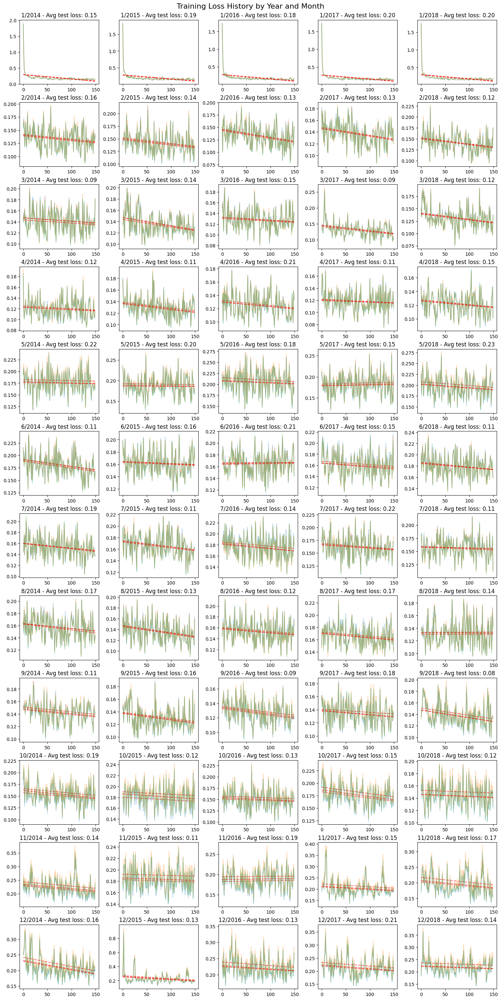

In [7]:
df6_best = df6[(df6['lr']==best_params[0]) & (df6['weight_decay']==best_params[1]) & (df6['memory_weight']==best_params[2])]

years = df6_best['test_year'].unique()
months = df6_best['test_month'].unique()
clients = df6_best['client_num'].unique()

# Determine the number of rows and columns for the subplots grid
n_rows = len(months)
n_cols = len(years)

# Create a figure and axes array of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 30), constrained_layout=True)

for j, year in enumerate(years):
    for i, month in enumerate(months):
        ax = axes[i, j] if n_rows > 1 and n_cols > 1 else (axes[j] if n_cols > 1 else axes[i])
        subset = df6_best[(df6_best['test_year'] == year) & (df6_best['test_month'] == month)]
        avg_test_loss = subset['test_loss'].mean()
        
        ax.set_title(f'{month}/{year} - Avg test loss: {avg_test_loss:.2f}')
        for client_num in clients:
            client_data = subset[subset['client_num'] == client_num]
            if not client_data.empty:
                training_loss_history = client_data['training_loss_history'].values[0]
                epochs = np.arange(len(training_loss_history))
                ax.plot(training_loss_history, label=f'Client {client_num}', alpha=0.3)
                
                # Add linear regression line
                if len(epochs) > 1:  # Ensure there are enough data points to fit a line
                    coeffs = np.polyfit(epochs, training_loss_history, 1)
                    linear_fit = np.poly1d(coeffs)
                    ax.plot(epochs, linear_fit(epochs), linestyle='--', color='red', alpha=0.6)

# Add a main title to the figure
fig.suptitle('Training Loss History by Year and Month', fontsize=16)

# Add legend outside the subplots
# handles, labels = ax.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

plt.show()

### Scenario 7: higher nbr of clients

In [5]:
def FL_scenario7(lr_, weight_decay_, test_year, NUM_CLIENTS,  selected_months=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], N_HISTORICAL_SAMPLES=300, N_FRESH_DAYS=30, memory_weight_=0.5, verbose=False):

    if verbose:
        print(f'lr: {lr_} - weight_decay: {weight_decay_} - test_year: {test_year}')

    results_list = []

    # Set the random seed
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    torch.manual_seed(random_seed)

    # Define scenario's parameters
    num_epochs = 150

    # Define the model
    global_model = TwoLayerNN(input_dim=len(train_columns), output_dim=1, hidden_dim1=32, hidden_dim2=32).to(DEVICE)
    for name, param in global_model.named_parameters():
        if 'weight' in name:
            nn.init.xavier_normal_(param)
        if 'bias' in name:
            nn.init.zeros_(param)

    # Define the client models
    client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

    # Store training values
    train_losses = {'client_{}'.format(i): {month: [] for month in selected_months} for i in range(NUM_CLIENTS)}
    client_data_stats = {'client_{}'.format(i): {month: {'x_mean': [], 'x_std': [], 'y_mean': [], 'y_std': []}
                                                  for month in selected_months} for i in range(NUM_CLIENTS)}

    for month in selected_months:
        
        current_date = datetime.date(test_year, month, 1)

        # Training loop
        for epoch in tqdm(range(num_epochs), desc="Epochs", disable=not verbose):
            
            # Ensure each client starts with the latest global model
            client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]
            
            for client_num in range(NUM_CLIENTS):
                client_model = client_models[client_num]
                client_model.train()

                optimizer = optim.SGD(
                    [param for param in client_model.parameters() if param.requires_grad],
                    lr=lr_,
                    momentum=0.9,
                    weight_decay=weight_decay_,
                )

                trainer = Trainer(
                    model=client_model,
                    criterion=nn.MSELoss(reduction='none').to(DEVICE),
                    metric=mse,
                    device=DEVICE,
                    optimizer=optimizer,
                    cast_label=False,
                )

                time_series_client = time_series[client_num]
                
                # Memory: random samples from the prediction window of previous years
                memory = []
                for _, row in time_series_client[(time_series_client['time'] > pd.to_datetime(current_date + pd.DateOffset(days=1))) & (time_series_client['time'] <= pd.to_datetime(current_date) + pd.DateOffset(days=30))].groupby(['month', 'day'])['time'].count().reset_index().iterrows():
                    memory.append(time_series_client[(time_series_client['month'] == row['month']) & (time_series_client['day'] == row['day']) & (time_series_client['year']<current_date.year)])
                memory = pd.concat(memory)
                memory = memory.sample(N_HISTORICAL_SAMPLES, random_state=random_seed+epoch)
                
                x_memory = memory[train_columns].values
                y_memory = memory['target'].values.reshape(-1, 1)
                
                x_mean, x_std = x_memory.mean(axis=0), x_memory.std(axis=0)
                y_mean, y_std = y_memory.mean(axis=0), y_memory.std(axis=0)
                
                x_memory = (x_memory - x_mean) / x_std
                y_memory = (y_memory - y_mean) / y_std

                memory_dataset = torch.utils.data.TensorDataset(torch.tensor(x_memory), torch.tensor(y_memory))
                memory_dataloader = DataLoader(memory_dataset, batch_size=N_HISTORICAL_SAMPLES, shuffle=True)
                
                # Stream: Last N_FRESH_DAYS days
                start_date = pd.to_datetime(current_date - pd.DateOffset(days=N_FRESH_DAYS))
                end_date = pd.to_datetime(current_date)
                stream = time_series_client[(time_series_client['time'] > start_date) & (time_series_client['time'] < end_date)]

                x_stream = stream[train_columns].values
                y_stream = stream['target'].values.reshape(-1, 1)

                x_stream = (x_stream - x_mean) / x_std
                y_stream = (y_stream - y_mean) / y_std

                stream_dataset = torch.utils.data.TensorDataset(torch.tensor(x_stream), torch.tensor(y_stream))
                stream_dataloader = DataLoader(stream_dataset, batch_size=N_FRESH_DAYS*(hour_end-hour_begin), shuffle=True)

                if len(client_data_stats['client_{}'.format(client_num)][month]['x_mean']) == 0:
                    client_data_stats['client_{}'.format(client_num)][month]['x_mean'].append(x_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['x_std'].append(x_std)
                    client_data_stats['client_{}'.format(client_num)][month]['y_mean'].append(y_mean)
                    client_data_stats['client_{}'.format(client_num)][month]['y_std'].append(y_std)
                
                if memory_weight_!=1:
                    for x_batch, y_batch in memory_dataloader:
                        x_batch = x_batch.to(DEVICE).type(torch.float32)
                        y_batch = y_batch.to(DEVICE).type(torch.float32)

                        optimizer.zero_grad()

                        outputs = client_model(x_batch)
                        loss_memory = trainer.criterion(outputs, y_batch).mean()
                else:
                    loss_memory = 0
                    
                if memory_weight_!=0:
                    for x_batch, y_batch in stream_dataloader:
                        x_batch = x_batch.to(DEVICE).type(torch.float32)
                        y_batch = y_batch.to(DEVICE).type(torch.float32)

                        optimizer.zero_grad()

                        outputs = client_model(x_batch)
                        loss_stream = trainer.criterion(outputs, y_batch).mean()
                else:
                    loss_stream = 0
                
                loss = memory_weight_ * loss_memory + (1-memory_weight_) * loss_stream

                loss.backward()
                
                optimizer.step()

                train_losses['client_{}'.format(client_num)][month].append(loss.item())

            
            # Average the models
            with torch.no_grad():
                global_model_dict = global_model.state_dict()
                for param in global_model_dict.keys():
                    param_sum = sum(client_models[i].state_dict()[param] for i in range(NUM_CLIENTS))
                    global_model_dict[param] = param_sum / NUM_CLIENTS
                global_model.load_state_dict(global_model_dict)

            client_models = [copy.deepcopy(global_model) for _ in range(NUM_CLIENTS)]

        # Store the means and stds for this client and month
        for client_num in range(NUM_CLIENTS):
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std'][0]
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'][0], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std'][0]

            client_data_stats['client_{}'.format(client_num)][month]['x_mean'] = x_mean
            client_data_stats['client_{}'.format(client_num)][month]['x_std'] = x_std
            client_data_stats['client_{}'.format(client_num)][month]['y_mean'] = y_mean
            client_data_stats['client_{}'.format(client_num)][month]['y_std'] = y_std

        # Set the model to evaluation mode
        global_model.eval()

        # Test for each client
        for client_num in range(NUM_CLIENTS):
            time_series_client = time_series[client_num]
            
            ## Testing dataset - next 30 days
            test = time_series_client[(time_series_client['time'] > pd.to_datetime(current_date + pd.DateOffset(days=1))) & (time_series_client['time'] <= pd.to_datetime(current_date) + pd.DateOffset(days=30))]

            x_test = test[train_columns].values
            y_test = test['target'].values.reshape(-1, 1)
        
            x_mean, x_std = client_data_stats['client_{}'.format(client_num)][month]['x_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['x_std']
            y_mean, y_std = client_data_stats['client_{}'.format(client_num)][month]['y_mean'], \
                            client_data_stats['client_{}'.format(client_num)][month]['y_std']

            x_test = (x_test - x_mean) / x_std
            y_test = (y_test - y_mean) / y_std
            y_test = np.array(y_test).reshape(-1, 1)

            with torch.no_grad():
                y_pred = global_model(torch.tensor(x_test).to(DEVICE).type(torch.float32))

            test_loss = trainer.criterion(y_pred, torch.tensor(y_test).to(DEVICE).type(torch.float32)).mean()

            # Store the results
            result = {
                'lr': lr_,
                'weight_decay': weight_decay_,
                'memory_weight': memory_weight_,
                'test_month': month,
                'test_year': test_year,
                'Number_of_clients': NUM_CLIENTS,
                'client_num': client_num,
                'y_true': y_test * y_std + y_mean,
                'y_pred': y_pred.cpu().numpy() * y_std + y_mean,
                'test_loss': test_loss.item(),
                'training_loss_history': train_losses['client_{}'.format(client_num)][month]
            }

            results_list.append(result)

    return results_list

In [6]:
results_dict = {}

for NUM_CLIENTS in tqdm(np.arange(3, 11), leave=True, position=0):
    
    # generate data
    env_dict = {'city_names':city_names,
            'num_clients': NUM_CLIENTS, 'num_modes': len(city_names),
            'tilt_std': 5, 'az_std': 5, 'weather_dev':0.1,
            'irrad_std':0.2, 'altitude_dev':0.1, 'shadow_peak_red':1,
            'module_name': get_available_modules('sandia')[0:NUM_CLIENTS], #['Canadian_Solar_CS5P_220M___2009_'],
            'inverter_name': get_available_inverters('cec')[0:NUM_CLIENTS], # ['ABB__MICRO_0_25_I_OUTD_US_208__208V_'],
            'lags':[1], 'months':[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], 'hours':np.arange(hour_begin, hour_end), 
            'train_scenarios':{'1y':{'m_train':None, 'train_years':[2018], 'valid_years':2019}}}

    env_dict = PVDataset(env_dict).generate_clients_data()
    time_series = []
    for client_ in range(NUM_CLIENTS):
        time_series_ = env_dict['train_scenarios']['1y']['time_series'][client_]

        # Remove nights
        time_series_ = time_series_[time_series_['hour_day'].isin(np.arange(hour_begin, hour_end))]

        # Add column day_of_month using column time
        time_series_['day'] = time_series_['time'].dt.day

        # Reorder columns
        time_series_ = time_series_[['time', 'year', 'month', 'day', 'hour_day', 'H_sun', 'T2m', 'WS10m', 'hourofd_x', 'hourofd_y', 'dayofy_x', 'dayofy_y', 'station_irrad_direct_prev', 'station_irrad_diffuse_prev', 'lag 1', 'target']]

        time_series.append(time_series_)
    # Define the values for test_year
    test_year_values = [2014, 2015, 2016, 2017, 2018]
    
    lr = 0.01
    weight_decay = 5e-3
    memory_weight = 0.5

    for test_year in tqdm(test_year_values, leave=False, position=1):
        key = (test_year, NUM_CLIENTS)
        results_dict[key] = pd.DataFrame(FL_scenario7(lr, weight_decay, test_year, NUM_CLIENTS, memory_weight_=memory_weight))
                
    # Concatenate DataFrames for different configurations into a single DataFrame
    final_df = pd.concat(results_dict.values(), ignore_index=True)

# Export to json
final_df.to_json('FL_results/FL_scenario7.json')

final_df.sample(3)
    

100%|██████████| 8/8 [2:37:15<00:00, 1179.45s/it]


,lr,weight_decay,memory_weight,test_month,test_year,Number_of_clients,client_num,y_true,y_pred,test_loss,training_loss_history
284,0.01,0.005,0.5,5,2016,10,4,"[[34.83889128250554], [36.63007739667787], [62...","[[42.31730903092931], [49.157135986366285], [4...",0.199981,"[0.2599480152130127, 0.24333378672599792, 0.24..."
538,0.01,0.005,0.5,6,2018,10,8,"[[75.26073602720636], [114.49738874493346], [1...","[[74.09702539497304], [106.35191227670354], [1...",0.143872,"[0.26274651288986206, 0.21542870998382568, 0.2..."
244,0.01,0.005,0.5,1,2016,10,4,"[[4.968231028530653], [-3.552713678800501e-15]...","[[15.453697352939832], [11.704670632958049], [...",0.269334,"[1.7970070838928223, 1.3531849384307861, 1.128..."


In [8]:
# Compute best results from Scenario 7
df7 = pd.read_json('FL_results/FL_scenario7.json')

# compute nbr of gs values
nbr_gs_values = len(df7['lr'].unique()) * len(df7['weight_decay'].unique()) * len(df7['memory_weight'].unique())
print(f'Scenario 7 tested with {nbr_gs_values} different hyperparameters combinations and {len(df7.client_num.unique())} clients')

best_params = df7.groupby(['lr', 'weight_decay', 'memory_weight'])['test_loss'].mean().idxmin()

print(f'Best parameters: lr={best_params[0]}, weight_decay={best_params[1]}, memory_weight={best_params[2]}')

display(df7[(df7['lr']==best_params[0]) & (df7['weight_decay']==best_params[1]) & (df7['memory_weight']==best_params[2])].groupby('test_year')['test_loss'].mean())

print('Overall loss over 5 years: %.3f ± %.3f' % (df7[(df7['lr']==best_params[0]) & (df7['weight_decay']==best_params[1]) & (df7['memory_weight']==best_params[2])].groupby('test_year')['test_loss'].mean().values.mean(), df7[(df7['lr']==best_params[0]) & (df7['weight_decay']==best_params[1]) & (df7['memory_weight']==best_params[2])].groupby('test_year')['test_loss'].mean().values.std()))

Scenario 7 tested with 1 different hyperparameters combinations and 10 clients
Best parameters: lr=0.01, weight_decay=0.005, memory_weight=0.5


test_year
2014    0.173141
2015    0.159881
2016    0.186208
2017    0.183256
2018    0.164935
Name: test_loss, dtype: float64

Overall loss over 5 years: 0.173 ± 0.010


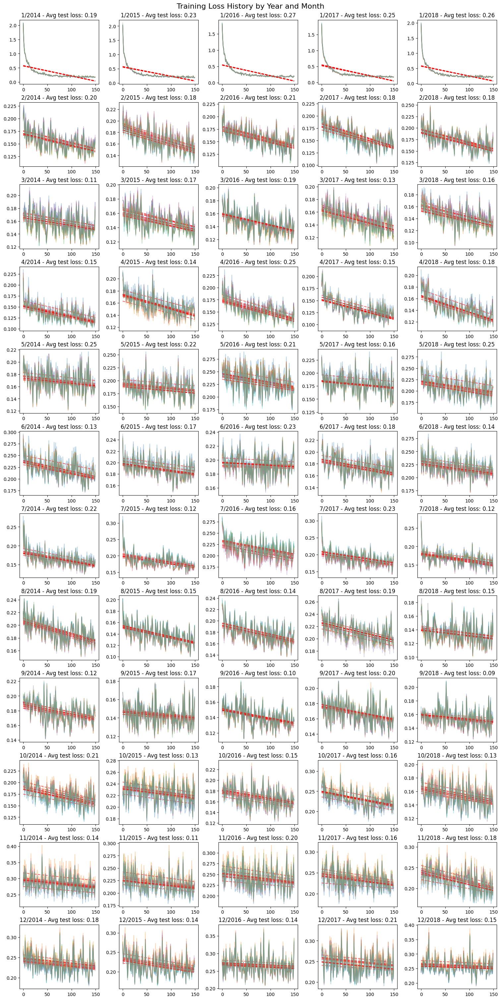

In [9]:
df7_best = df7[(df7['lr']==best_params[0]) & (df7['weight_decay']==best_params[1]) & (df7['memory_weight']==best_params[2])]

years = df7_best['test_year'].unique()
months = df7_best['test_month'].unique()
clients = df7_best['client_num'].unique()

# Determine the number of rows and columns for the subplots grid
n_rows = len(months)
n_cols = len(years)

# Create a figure and axes array of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 30), constrained_layout=True)

for j, year in enumerate(years):
    for i, month in enumerate(months):
        ax = axes[i, j] if n_rows > 1 and n_cols > 1 else (axes[j] if n_cols > 1 else axes[i])
        subset = df7_best[(df7_best['test_year'] == year) & (df7_best['test_month'] == month)]
        avg_test_loss = subset['test_loss'].mean()
        
        ax.set_title(f'{month}/{year} - Avg test loss: {avg_test_loss:.2f}')
        for client_num in clients:
            client_data = subset[subset['client_num'] == client_num]
            if not client_data.empty:
                training_loss_history = client_data['training_loss_history'].values[0]
                epochs = np.arange(len(training_loss_history))
                ax.plot(training_loss_history, label=f'Client {client_num}', alpha=0.3)
                
                # Add linear regression line
                if len(epochs) > 1:  # Ensure there are enough data points to fit a line
                    coeffs = np.polyfit(epochs, training_loss_history, 1)
                    linear_fit = np.poly1d(coeffs)
                    ax.plot(epochs, linear_fit(epochs), linestyle='--', color='red', alpha=0.6)

# Add a main title to the figure
fig.suptitle('Training Loss History by Year and Month', fontsize=16)

# Add legend outside the subplots
# handles, labels = ax.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1))

plt.show()

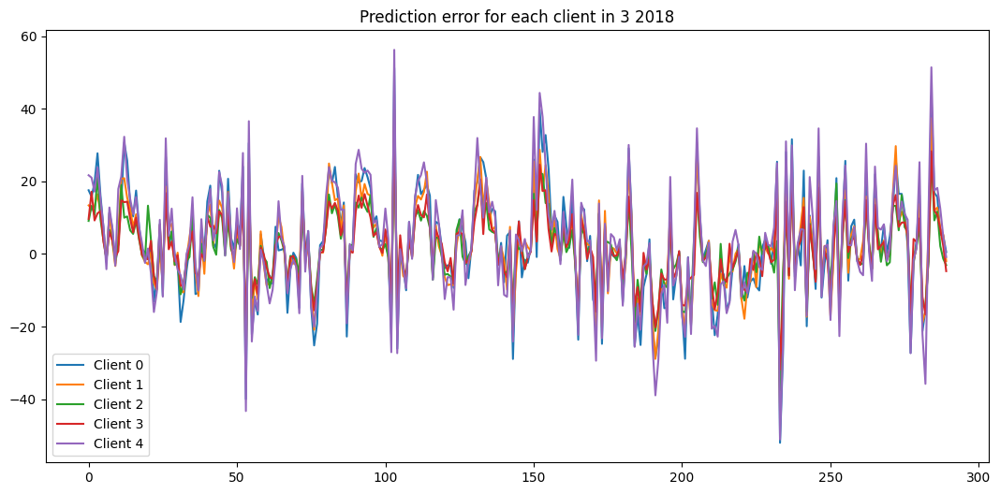

In [12]:
test_month = 3
test_year = 2018


plt.figure(figsize=(13, 6))
for client_num in range(5):
    plt.plot(np.array(df7[(df7['test_month']==test_month) & (df7['test_year']==test_year) & (df7['client_num']==client_num)]['y_pred'].values[0]) - np.array(df7[(df7['test_month']==test_month) & (df7['test_year']==test_year) & (df7['client_num']==client_num)]['y_true'].values[0]), label=f'Client {client_num}')
plt.legend()
plt.title(f'Prediction error for each client in {test_month} {test_year}')
plt.show()

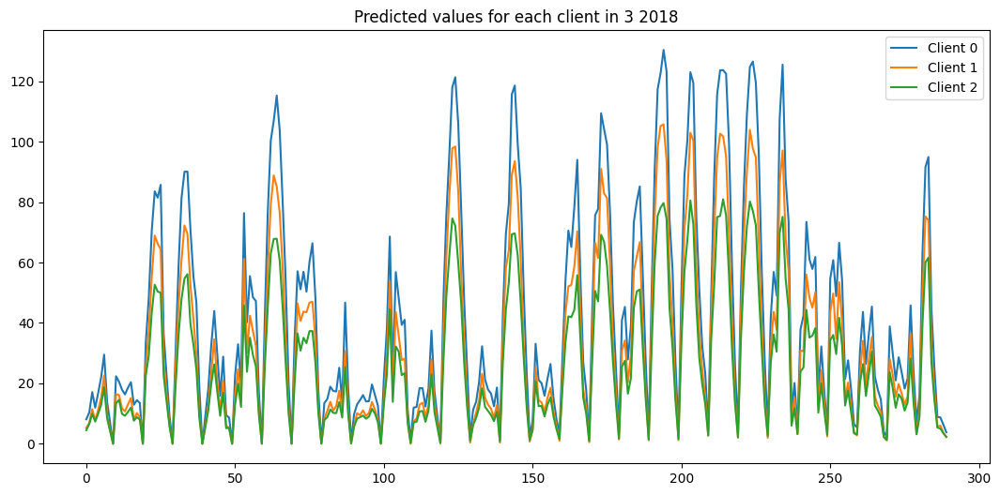

In [13]:
test_month = 3
test_year = 2018


plt.figure(figsize=(13, 6))
for client_num in range(3):
    plt.plot(df7[(df7['test_month']==test_month) & (df7['test_year']==test_year) & (df7['client_num']==client_num)]['y_true'].values[0], label=f'Client {client_num}')
plt.legend()
plt.title(f'Predicted values for each client in {test_month} {test_year}')
plt.show()